<h1><font color="#8A0883" size=5 >Reconocimiento de patrones</font></h1>
<h2><font color="#8A0883" size=4 >Percepcion y visión por computadora</font></h2>
<div style="text-align: right">
<hr style="height:1px">
<font color="#020D5F" size=3>Elaborado por: Alberth Jesus Vigo Saldaña</font><br>
<font color="#020D5F" size=3>Manuel Oswaldo Juarez Mayo</font>
<hr style="height:1px; color:#8A0883">

### Configuración de Entorno para Uso de CPU

In [1]:
'''
import os
os.environ["LOKY_MAX_CPU_COUNT"] = "8"  # Usa hasta 8 núcleos lógicos
'''
# Descomentarlo y ajustarlo de acuerdo a su entorno

### Instalación de Paquetes para el Item I

In [47]:
!pip install matplotlib
!pip install mahotas
!pip install cv
!pip install scikit-image
!pip install opencv-python

   ---------------------------------------- 0.0/1.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.7 MB ? eta -:--:--
    --------------------------------------- 0.0/1.7 MB 487.6 kB/s eta 0:00:04
   -- ------------------------------------- 0.1/1.7 MB 930.9 kB/s eta 0:00:02
   ------ --------------------------------- 0.3/1.7 MB 1.8 MB/s eta 0:00:01
   ------------- -------------------------- 0.6/1.7 MB 2.7 MB/s eta 0:00:01
   ------------------------ --------------- 1.0/1.7 MB 4.1 MB/s eta 0:00:01
   ------------------------ --------------- 1.0/1.7 MB 4.1 MB/s eta 0:00:01
   ---------------------------------------- 1.7/1.7 MB 5.0 MB/s eta 0:00:00
   ---------------------------------------- 0.0/12.9 MB ? eta -:--:--
   ---------------------------------------- 0.1/12.9 MB 3.4 MB/s eta 0:00:04
    --------------------------------------- 0.2/12.9 MB 2.5 MB/s eta 0:00:06
   - -------------------------------------- 0.5/12.9 MB 3.5 MB/s eta 0:00:04
   --- ------------------

### Importación de Librerías para Procesamiento y Análisis de Imágenes

In [48]:
import numpy as np
import cv2 as cv2
import io as io
import math
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpi
from PIL import Image
import mahotas
import mahotas.demos
from scipy.ndimage import gaussian_filter, median_filter
from skimage import filters, morphology, util, metrics, measure
from skimage.filters import threshold_niblack, threshold_sauvola
from skimage.morphology import skeletonize, convex_hull_image
from skimage.io import imread
from skimage import color
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display
import os
from skimage import measure
from skimage.measure import label, regionprops, euler_number
import pandas as pd
from IPython.display import display 
from skimage import io, color, filters, morphology

## ITEM 1 - ANÁLISIS DE IMÁGENES Y EXTRACCIÓN DE PATRONES
#### Lectura y conversión a escala de grises

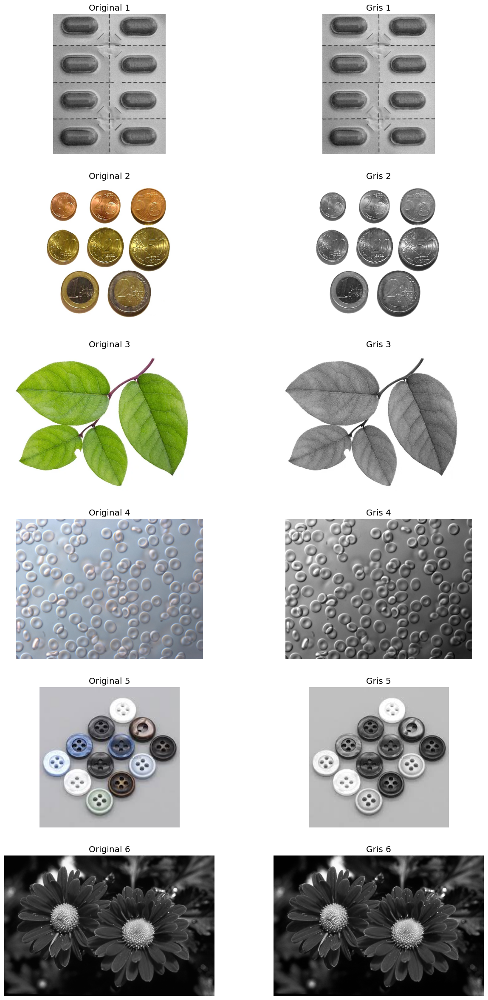

In [50]:
import cv2
import matplotlib.pyplot as plt

# Lista de rutas de las imágenes
image_paths = [
    "./imagenes/pills.png",
    "./imagenes/monedas2.jpg",
    "./imagenes/hoja.jpg",
    "./imagenes/cell2.jpg",
    "./imagenes/botones01.jpg",
    "./imagenes/124084.png"
]

def read_images(paths):
    images = []
    for path in paths:
        img = cv2.imread(path)
        if img is not None:
            images.append(img)
        else:
            print(f"Error al leer la imagen {path}")
    return images

def convert_to_grayscale(images):
    gray_images = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in images]
    return gray_images

def show_color_and_gray_images(color_images, gray_images, titles):
    num_images = len(color_images)
    plt.figure(figsize=(15, 5 * num_images))
    for i in range(num_images):
        plt.subplot(num_images, 2, 2*i + 1)
        plt.imshow(cv2.cvtColor(color_images[i], cv2.COLOR_BGR2RGB))
        plt.title(f"Original {i+1}")
        plt.axis('off')
        
        plt.subplot(num_images, 2, 2*i + 2)
        plt.imshow(gray_images[i], cmap='gray')
        plt.title(f"Gris {i+1}")
        plt.axis('off')
    plt.show()

# Leer las imágenes originales
original_images = read_images(image_paths)

# Convertir a escala de grises
gray_images = convert_to_grayscale(original_images)

# Mostrar imágenes originales y en escala de grises
show_color_and_gray_images(original_images, gray_images, [f"Imagen {i+1}" for i in range(len(original_images))])


#### Conteo de objetos y descriptores para la imagen pills

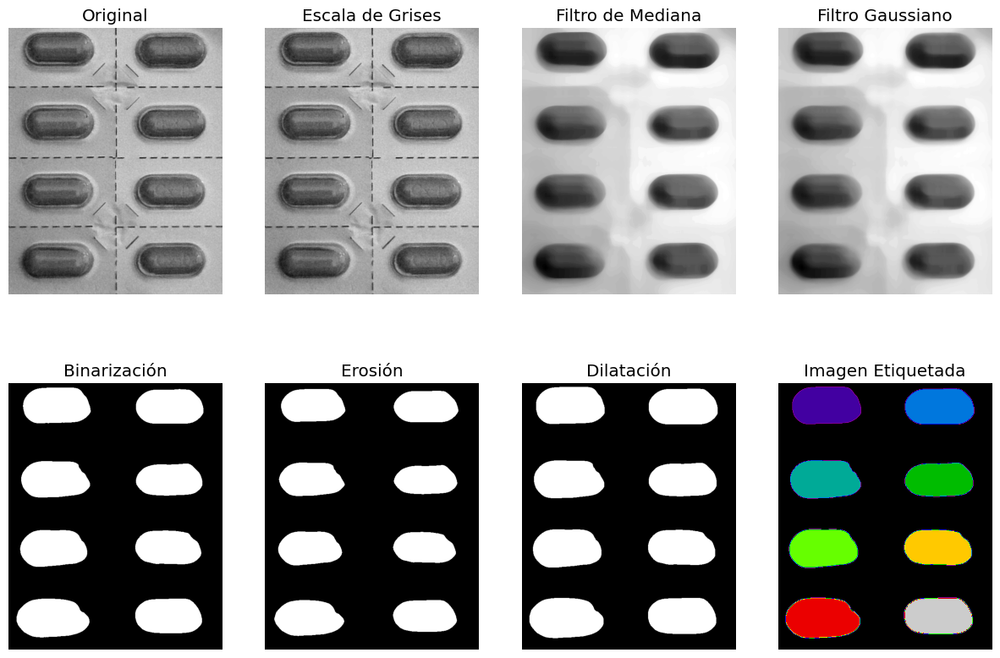

Número de objetos (Característica de Euler): 8
Número de objetos (4-conectividad): 8
Número de objetos (8-conectividad): 8


,ID,Área,Perímetro,Diámetro Equivalente,Distancia Máxima al Centro,Distancia Mínima al Centro
0,1,17792.0,523.119841,150.510724,100.145859,0.495990
1,2,17255.0,515.948268,148.221956,98.920234,0.084932
2,3,17794.0,529.504617,150.519183,104.203298,0.351850
3,4,15504.0,499.362482,140.500199,97.012598,0.516486
4,5,17612.0,523.504617,149.747437,99.930408,0.421100
5,6,16101.0,504.190909,143.179712,97.981180,0.333469
6,7,19459.0,552.617316,157.403838,108.884954,0.346901
7,8,17152.0,515.119841,147.778905,97.972719,0.093003


In [51]:

# Ruta de la imagen
image_path = "./imagenes/pills.png"

def read_image(path):
    img = cv2.imread(path)
    if img is not None:
        return img
    else:
        print(f"Error al leer la imagen {path}")
        return None

def convert_to_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

def apply_gaussian_filter(image, kernel_size=(5, 5), sigma=0):
    return cv2.GaussianBlur(image, kernel_size, sigma)

def apply_median_filter(image, kernel_size=51):
    return cv2.medianBlur(image, kernel_size)

def fixed_threshold_binarization(image, threshold=128):
    _, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY_INV)
    return binary_image

def apply_morphology(image, operation, kernel_size=(3, 3), iterations=1):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel_size)
    morphed_image = cv2.morphologyEx(image, operation, kernel, iterations=iterations)
    return morphed_image

def etiquetar_objetos(imagen_preprocesada):
    labels = measure.label(imagen_preprocesada, connectivity=1)
    euler = measure.euler_number(imagen_preprocesada, connectivity=1)
    num_objects = (len(set(labels.flat)) - 1)
    holes = num_objects - euler
    num_labels_4, labels_im_4 = connected_components(imagen_preprocesada, connectivity=4)
    num_labels_8, labels_im_8 = connected_components(imagen_preprocesada, connectivity=8)
    
    return labels, num_objects, num_labels_4, num_labels_8

def connected_components(image, connectivity):
    # Analizar componentes
    num_labels, labels_im = cv2.connectedComponents(image, connectivity)
    return num_labels, labels_im

def extract_descriptors(label_image):
    properties = regionprops(label_image)
    descriptors = []
    for prop in properties:
        distances = [np.linalg.norm(np.array(prop.centroid) - np.array(coord)) for coord in prop.coords]
        descriptor = {
            'ID': prop.label,
            'Área': prop.area,
            'Perímetro': prop.perimeter,
            'Diámetro Equivalente': prop.equivalent_diameter,
            'Distancia Máxima al Centro': max(distances),
            'Distancia Mínima al Centro': min(distances)
        }
        descriptors.append(descriptor)
    return descriptors

# Leer la imagen "pills"
pills_image = read_image(image_path)

# Convertir a escala de grises
pills_gray = convert_to_grayscale(pills_image)

# Aplicar filtro de mediana
pills_median = apply_median_filter(pills_gray, kernel_size=51)

# Aplicar filtro de eliminación de ruido gaussiano
pills_gaussian = apply_gaussian_filter(pills_median, kernel_size=(5, 5), sigma=0)

# Aplicar binarización con un umbral fijo
pills_binary = fixed_threshold_binarization(pills_gaussian, threshold=128)

# Aplicar erosión
pills_erode = apply_morphology(pills_binary, cv2.MORPH_ERODE, kernel_size=(5, 5), iterations=2)

# Aplicar dilatación
pills_dilate = apply_morphology(pills_erode, cv2.MORPH_DILATE, kernel_size=(5, 5), iterations=3)

# Etiquetar la imagen y contar el número de características
imagen_etiquetada, num_objects, num_labels_4, num_labels_8 = etiquetar_objetos(pills_dilate)

# Extraer descriptores
descriptores1 = extract_descriptors(imagen_etiquetada)

# Convertir los descriptores a un DataFrame
df1_descriptores = pd.DataFrame(descriptores1)

# Mostrar imágenes procesadas
plt.figure(figsize=(15, 10))

plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(pills_image, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis('off')

plt.subplot(2, 4, 2)
plt.imshow(pills_gray, cmap='gray')
plt.title("Escala de Grises")
plt.axis('off')

plt.subplot(2, 4, 3)
plt.imshow(pills_median, cmap='gray')
plt.title("Filtro de Mediana")
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(pills_gaussian, cmap='gray')
plt.title("Filtro Gaussiano")
plt.axis('off')

plt.subplot(2, 4, 5)
plt.imshow(pills_binary, cmap='gray')
plt.title("Binarización")
plt.axis('off')

plt.subplot(2, 4, 6)
plt.imshow(pills_erode, cmap='gray')
plt.title("Erosión")
plt.axis('off')

plt.subplot(2, 4, 7)
plt.imshow(pills_dilate, cmap='gray')
plt.title("Dilatación")
plt.axis('off')

plt.subplot(2, 4, 8)
plt.imshow(imagen_etiquetada, cmap='nipy_spectral')
plt.title("Imagen Etiquetada")
plt.axis('off')

plt.show()

# Mostrar resultados en una tabla
print(f"Número de objetos (Característica de Euler): {num_objects}")
print(f"Número de objetos (4-conectividad): {num_labels_4-1}")
print(f"Número de objetos (8-conectividad): {num_labels_8-1}")
display(df1_descriptores)  # Mostrar el DataFrame usando display()


#### Conteo de objetos y descriptores para la imagen monedas2

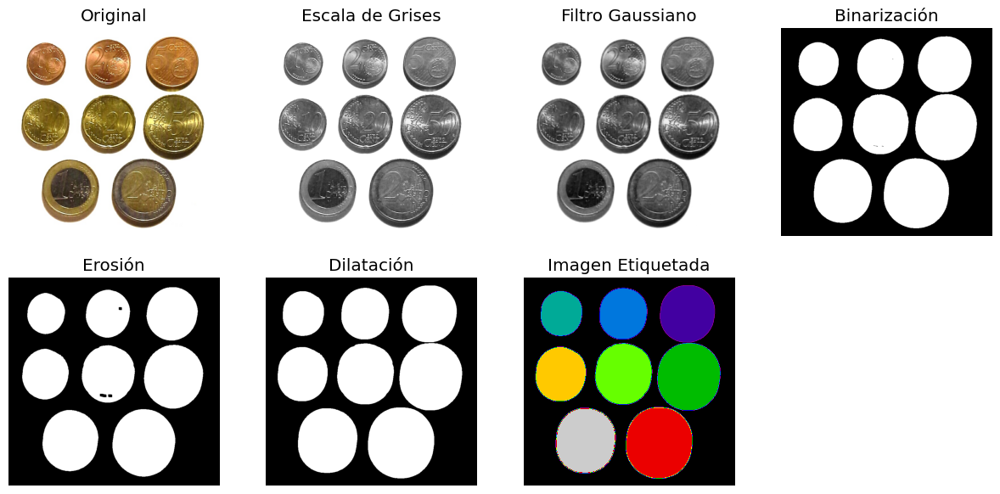

Número de objetos (Característica de Euler): 8
Número de objetos (4-conectividad): 8
Número de objetos (8-conectividad): 8


,ID,Área,Perímetro,Diámetro Equivalente,Distancia Máxima al Centro,Distancia Mínima al Centro
0,1,30897.0,653.227489,198.341328,101.893303,0.520322
1,2,24320.0,581.286363,175.969275,91.159069,0.508391
2,3,18226.0,503.102597,152.335367,79.040559,0.109296
3,4,41689.0,761.553391,230.391153,119.233807,0.442788
4,5,34054.0,691.955411,208.227999,108.261237,0.423734
5,6,26751.0,611.771645,184.554683,95.858424,0.414299
6,7,46699.0,805.109740,243.842190,125.615912,0.480774
7,8,38234.0,730.097546,220.637804,114.691359,0.160117


In [52]:

# Ruta de la imagen
image_path = "./imagenes/monedas2.jpg"

def read_image(path):
    img = cv2.imread(path)
    if img is not None:
        return img
    else:
        print(f"Error al leer la imagen {path}")
        return None

def convert_to_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

def apply_gaussian_filter(image, kernel_size=(5, 5), sigma=0):
    return cv2.GaussianBlur(image, kernel_size, sigma)

def fixed_threshold_binarization(image, threshold=128):
    _, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY_INV)
    return binary_image

def apply_morphology(image, operation, kernel_size=(3, 3), iterations=1):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel_size)
    morphed_image = cv2.morphologyEx(image, operation, kernel, iterations=iterations)
    return morphed_image

def etiquetar_objetos(imagen_preprocesada):
    labels = measure.label(imagen_preprocesada, connectivity=1)
    euler = measure.euler_number(imagen_preprocesada, connectivity=1)
    num_objects = (len(set(labels.flat)) - 1)
    holes = num_objects - euler
    num_labels_4, labels_im_4 = connected_components(imagen_preprocesada, connectivity=4)
    num_labels_8, labels_im_8 = connected_components(imagen_preprocesada, connectivity=8)
    
    return labels, num_objects, num_labels_4, num_labels_8

def connected_components(image, connectivity):
    # Analizar componentes
    num_labels, labels_im = cv2.connectedComponents(image, connectivity)
    return num_labels, labels_im

def extract_descriptors(label_image):
    properties = regionprops(label_image)
    descriptors = []
    for prop in properties:
        distances = [np.linalg.norm(np.array(prop.centroid) - np.array(coord)) for coord in prop.coords]
        descriptor = {
            'ID': prop.label,
            'Área': prop.area,
            'Perímetro': prop.perimeter,
            'Diámetro Equivalente': prop.equivalent_diameter,
            'Distancia Máxima al Centro': max(distances),
            'Distancia Mínima al Centro': min(distances)
        }
        descriptors.append(descriptor)
    return descriptors

# Leer la imagen "monedas2"
monedas2_image = read_image(image_path)

# Convertir a escala de grises
monedas2_gray = convert_to_grayscale(monedas2_image)

# Aplicar filtro de eliminación de ruido gaussiano
monedas2_gaussian = apply_gaussian_filter(monedas2_gray, kernel_size=(5, 5), sigma=0)

# Aplicar binarización con un umbral fijo
monedas2_binary = fixed_threshold_binarization(monedas2_gaussian, threshold=244)

# Aplicar erosión
monedas2_erode = apply_morphology(monedas2_binary, cv2.MORPH_ERODE, kernel_size=(5, 5), iterations=2)

# Aplicar dilatación
monedas2_dilate = apply_morphology(monedas2_erode, cv2.MORPH_DILATE, kernel_size=(5, 5), iterations=3)

# Etiquetar la imagen y contar el número de características
imagen_etiquetada, num_objects, num_labels_4, num_labels_8 = etiquetar_objetos(monedas2_dilate)

# Extraer descriptores
descriptores2 = extract_descriptors(imagen_etiquetada)

# Convertir los descriptores a un DataFrame
df2_descriptores = pd.DataFrame(descriptores2)

plt.figure(figsize=(15, 7))

plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(monedas2_image, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis('off')

plt.subplot(2, 4, 2)
plt.imshow(monedas2_gray, cmap='gray')
plt.title("Escala de Grises")
plt.axis('off')

plt.subplot(2, 4, 3)
plt.imshow(monedas2_gaussian, cmap='gray')
plt.title("Filtro Gaussiano")
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(monedas2_binary, cmap='gray')
plt.title("Binarización")
plt.axis('off')

plt.subplot(2, 4, 5)
plt.imshow(monedas2_erode, cmap='gray')
plt.title("Erosión")
plt.axis('off')

plt.subplot(2, 4, 6)
plt.imshow(monedas2_dilate, cmap='gray')
plt.title("Dilatación")
plt.axis('off')

plt.subplot(2, 4, 7)
plt.imshow(imagen_etiquetada, cmap='nipy_spectral')
plt.title("Imagen Etiquetada")
plt.axis('off')

plt.show()

# Mostrar resultados en una tabla
print(f"Número de objetos (Característica de Euler): {num_objects}")
print(f"Número de objetos (4-conectividad): {num_labels_4-1}")
print(f"Número de objetos (8-conectividad): {num_labels_8-1}")
display(df2_descriptores)  # Mostrar el DataFrame usando display()



#### Conteo de objetos y descriptores para la imagen hoja

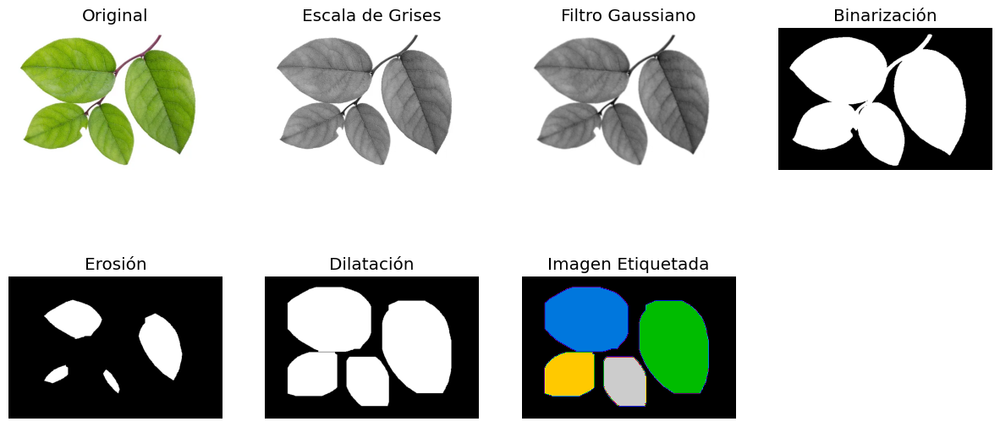

Número de objetos (Característica de Euler): 4
Número de objetos (4-conectividad): 4
Número de objetos (8-conectividad): 4


,ID,Área,Perímetro,Diámetro Equivalente,Distancia Máxima al Centro,Distancia Mínima al Centro
0,1,35906.0,721.144228,213.815198,127.860110,0.355124
1,2,41812.0,786.600072,230.730778,149.364081,0.496758
2,3,15604.0,478.409163,140.952580,88.246023,0.354369
3,4,14609.0,459.622366,136.384590,88.499290,0.468573


In [53]:

# Ruta de la imagen
image_path = "./imagenes/hoja.jpg"

def read_image(path):
    img = cv2.imread(path)
    if img is not None:
        return img
    else:
        print(f"Error al leer la imagen {path}")
        return None

def convert_to_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

def apply_gaussian_filter(image, kernel_size=(5, 5), sigma=0):
    return cv2.GaussianBlur(image, kernel_size, sigma)

def fixed_threshold_binarization(image, threshold=250):
    _, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY_INV)
    return binary_image

def apply_morphology(image, operation, kernel_size=(3, 3), iterations=1):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel_size)
    morphed_image = cv2.morphologyEx(image, operation, kernel, iterations=iterations)
    return morphed_image

def etiquetar_objetos(imagen_preprocesada):
    labels = measure.label(imagen_preprocesada, connectivity=1)
    euler = measure.euler_number(imagen_preprocesada, connectivity=1)
    num_objects = (len(set(labels.flat)) - 1)
    holes = num_objects - euler
    num_labels_4, labels_im_4 = connected_components(imagen_preprocesada, connectivity=4)
    num_labels_8, labels_im_8 = connected_components(imagen_preprocesada, connectivity=8)
    
    return labels, num_objects, num_labels_4, num_labels_8

def connected_components(image, connectivity):
    # Analizar componentes
    num_labels, labels_im = cv2.connectedComponents(image, connectivity)
    return num_labels, labels_im

def extract_descriptors(label_image):
    properties = regionprops(label_image)
    descriptors = []
    for prop in properties:
        distances = [np.linalg.norm(np.array(prop.centroid) - np.array(coord)) for coord in prop.coords]
        descriptor = {
            'ID': prop.label,
            'Área': prop.area,
            'Perímetro': prop.perimeter,
            'Diámetro Equivalente': prop.equivalent_diameter,
            'Distancia Máxima al Centro': max(distances),
            'Distancia Mínima al Centro': min(distances)
        }
        descriptors.append(descriptor)
    return descriptors

# Leer la imagen "hoja"
hoja_image = read_image(image_path)

# Convertir a escala de grises
hoja_gray = convert_to_grayscale(hoja_image)

# Aplicar filtro de eliminación de ruido gaussiano
hoja_gaussian = apply_gaussian_filter(hoja_gray, kernel_size=(5, 5), sigma=0)

# Aplicar binarización con un umbral fijo
hoja_binary = fixed_threshold_binarization(hoja_gaussian, threshold=250)

# Aplicar erosión
hoja_erode = apply_morphology(hoja_binary, cv2.MORPH_ERODE, kernel_size=(5, 5), iterations=18)

# Aplicar dilatación
hoja_dilate = apply_morphology(hoja_erode, cv2.MORPH_DILATE, kernel_size=(5, 5), iterations=18)

# Etiquetar la imagen y contar el número de características
imagen_etiquetada, num_objects, num_labels_4, num_labels_8 = etiquetar_objetos(hoja_dilate)

# Extraer descriptores
descriptores3 = extract_descriptors(imagen_etiquetada)

# Convertir los descriptores a un DataFrame
df3_descriptores = pd.DataFrame(descriptores3)

plt.figure(figsize=(15, 7))

plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(hoja_image, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis('off')

plt.subplot(2, 4, 2)
plt.imshow(hoja_gray, cmap='gray')
plt.title("Escala de Grises")
plt.axis('off')

plt.subplot(2, 4, 3)
plt.imshow(hoja_gaussian, cmap='gray')
plt.title("Filtro Gaussiano")
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(hoja_binary, cmap='gray')
plt.title("Binarización")
plt.axis('off')

plt.subplot(2, 4, 5)
plt.imshow(hoja_erode, cmap='gray')
plt.title("Erosión")
plt.axis('off')

plt.subplot(2, 4, 6)
plt.imshow(hoja_dilate, cmap='gray')
plt.title("Dilatación")
plt.axis('off')

plt.subplot(2, 4, 7)
plt.imshow(imagen_etiquetada, cmap='nipy_spectral')
plt.title("Imagen Etiquetada")
plt.axis('off')

plt.show()

# Mostrar resultados en una tabla
print(f"Número de objetos (Característica de Euler): {num_objects}")
print(f"Número de objetos (4-conectividad): {num_labels_4-1}")
print(f"Número de objetos (8-conectividad): {num_labels_8-1}")
display(df3_descriptores)  # Mostrar el DataFrame usando display()


#### Conteo de objetos y descriptores para la imagen cell2

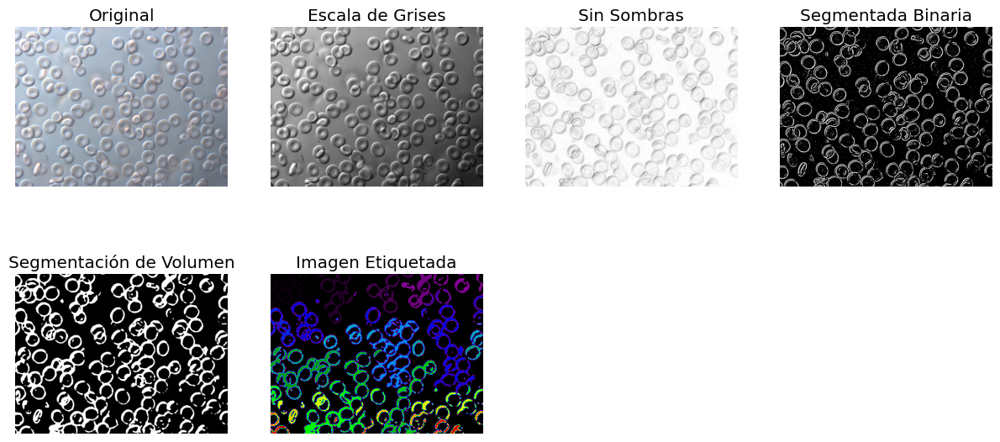

Número de objetos (Característica de Euler): 160
Número de objetos (4-conectividad): 160
Número de objetos (8-conectividad): 160


,ID,Área,Perímetro,Diámetro Equivalente,Distancia Máxima al Centro,Distancia Mínima al Centro
0,1,25984.0,3455.441051,181.889682,195.156638,0.422396
1,2,1434.0,229.580736,42.729679,51.037583,0.181548
2,3,25305.0,3247.718180,179.497428,203.383991,10.652771
3,4,99.0,61.071068,11.227231,15.834341,0.299985
4,5,17498.0,2346.039897,149.262003,163.845946,1.621877
...,...,...,...,...,...,...
155,156,174.0,60.041631,14.884343,12.997190,0.675037
156,157,49.0,25.207107,7.898654,5.042758,0.606778
157,158,13.0,10.828427,4.068429,2.307692,0.307692
158,159,55.0,36.485281,8.368284,8.274705,0.298204


In [55]:

# Ruta de la imagen
image_path = "./imagenes/cell2.jpg"

def read_image(path):
    img = cv2.imread(path)
    if img is not None:
        return img
    else:
        print(f"Error al leer la imagen {path}")
        return None

def convert_to_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

def shadow_remove(img):
    rgb_planes = cv2.split(img)
    result_norm_planes = []
    for plane in rgb_planes:
        dilated_img = cv2.dilate(plane, np.ones((3,3), np.uint8))
        bg_img = cv2.medianBlur(dilated_img, 5)
        diff_img = 255 - cv2.absdiff(plane, bg_img)
        norm_img = cv2.normalize(diff_img, None, alpha=10, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
        result_norm_planes.append(norm_img)
    shadowremov = cv2.merge(result_norm_planes)
    # Convertir a escala de grises si es necesario
    if len(shadowremov.shape) == 3:
        shadowremov = cv2.cvtColor(shadowremov, cv2.COLOR_BGR2GRAY)
    return shadowremov

def binary_cells2(image):
    gray_image = image
    blurred = cv2.GaussianBlur(gray_image, (3, 3), 0)
    blurred = cv2.medianBlur(blurred, 7)
    thresholded_image = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)
    kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (5, 5))
    morph = cv2.morphologyEx(thresholded_image, cv2.MORPH_CLOSE, kernel, iterations=1)
    morph = cv2.morphologyEx(morph, cv2.MORPH_DILATE, kernel, iterations=1)
    morph = cv2.morphologyEx(morph, cv2.MORPH_ERODE, kernel, iterations=1)  
    morph = cv2.morphologyEx(morph, cv2.MORPH_CLOSE, kernel, iterations=1) 
    morph = cv2.morphologyEx(morph, cv2.MORPH_DILATE, kernel, iterations=1)
    morph = cv2.medianBlur(morph, 17)
    return thresholded_image, morph

def etiquetar_objetos(imagen_preprocesada):
    labels = measure.label(imagen_preprocesada, connectivity=1)
    euler = measure.euler_number(imagen_preprocesada, connectivity=1)
    num_objects = (len(set(labels.flat)) - 1)
    holes = num_objects - euler
    num_labels_4, labels_im_4 = connected_components(imagen_preprocesada, connectivity=4)
    num_labels_8, labels_im_8 = connected_components(imagen_preprocesada, connectivity=8)
    
    return labels, num_objects, num_labels_4, num_labels_8

def connected_components(image, connectivity):
    # Analizar componentes
    num_labels, labels_im = cv2.connectedComponents(image, connectivity)
    return num_labels, labels_im

def extract_descriptors(label_image):
    properties = regionprops(label_image)
    descriptors = []
    for prop in properties:
        distances = [np.linalg.norm(np.array(prop.centroid) - np.array(coord)) for coord in prop.coords]
        descriptor = {
            'ID': prop.label,
            'Área': prop.area,
            'Perímetro': prop.perimeter,
            'Diámetro Equivalente': prop.equivalent_diameter,
            'Distancia Máxima al Centro': max(distances),
            'Distancia Mínima al Centro': min(distances)
        }
        descriptors.append(descriptor)
    return descriptors

# Leer la imagen "cell2"
cell2_image = read_image(image_path)

# Convertir a escala de grises
cell2_gray = convert_to_grayscale(cell2_image)

# Aplicar eliminación de sombras
shadow_removed_image = shadow_remove(cell2_image)

# Binarizar la imagen con las funciones de binarización
binary_segmented_image, leaves_image = binary_cells2(shadow_removed_image)

# Etiquetar la imagen y contar el número de características
imagen_etiquetada, num_objects, num_labels_4, num_labels_8 = etiquetar_objetos(leaves_image)

# Extraer descriptores
descriptores4 = extract_descriptors(imagen_etiquetada)

# Convertir los descriptores a un DataFrame
df4_descriptores = pd.DataFrame(descriptores4)

plt.figure(figsize=(15, 7))

plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(cell2_image, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis('off')

plt.subplot(2, 4, 2)
plt.imshow(cell2_gray, cmap='gray')
plt.title("Escala de Grises")
plt.axis('off')

plt.subplot(2, 4, 3)
plt.imshow(shadow_removed_image, cmap='gray')
plt.title("Sin Sombras")
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(binary_segmented_image, cmap='gray')
plt.title("Segmentada Binaria")
plt.axis('off')

plt.subplot(2, 4, 5)
plt.imshow(leaves_image, cmap='gray')
plt.title("Segmentación de Volumen")
plt.axis('off')

plt.subplot(2, 4, 6)
plt.imshow(imagen_etiquetada, cmap='nipy_spectral')
plt.title("Imagen Etiquetada")
plt.axis('off')

plt.show()

# Mostrar resultados en una tabla
print(f"Número de objetos (Característica de Euler): {num_objects}")
print(f"Número de objetos (4-conectividad): {num_labels_4-1}")
print(f"Número de objetos (8-conectividad): {num_labels_8-1}")
display(df4_descriptores)  # Mostrar el DataFrame usando display()


#### Conteo de objetos y descriptores para la imagen botones01

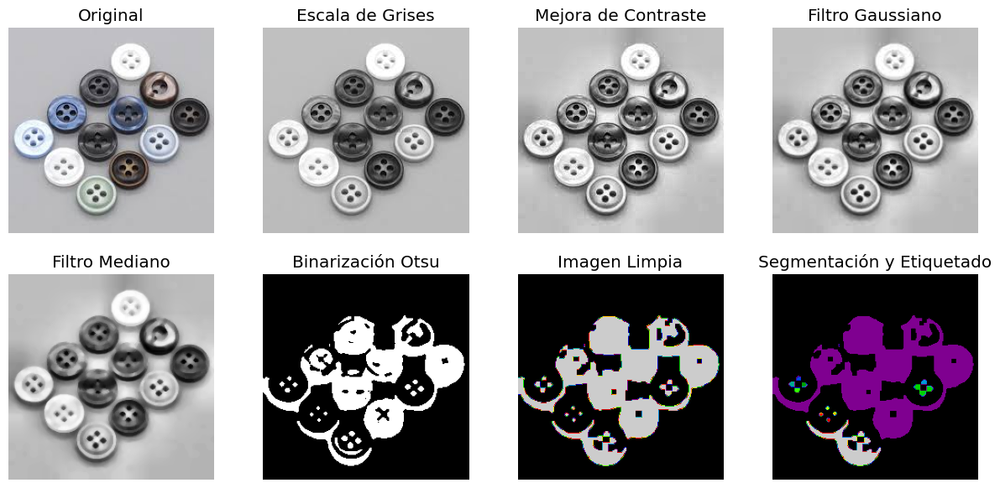

Número de objetos (Característica de Euler): 13
Número de objetos (4-conectividad): 13
Número de objetos (8-conectividad): 13


,ID,Área,Perímetro,Diámetro Equivalente,Distancia Máxima al Centro,Distancia Mínima al Centro
0,1,10520.0,1498.543289,115.734524,124.317425,0.476225
1,2,3.0,1.000000,1.954410,1.000000,0.000000
2,3,20.0,14.242641,5.046265,2.610077,0.460977
3,4,26.0,16.242641,5.753627,3.168353,0.438529
4,5,30.0,17.656854,6.180387,3.243626,0.504425
5,6,24.0,15.656854,5.527906,3.041667,0.041667
6,7,110.0,60.970563,11.834541,10.430744,1.634974
7,8,27.0,16.828427,5.863230,3.164663,0.447520
8,9,12.0,9.656854,3.908820,1.581139,0.707107
9,10,12.0,9.656854,3.908820,1.581139,0.707107


In [56]:
import cv2
import numpy as np
import pandas as pd
from skimage import measure
from skimage.measure import regionprops
import matplotlib.pyplot as plt

# Ruta de la imagen
image_path = "./imagenes/botones01.jpg"

def read_image(path):
    img = cv2.imread(path)
    if img is not None:
        return img
    else:
        print(f"Error al leer la imagen {path}")
        return None

def convert_to_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

def enhance_contrast(image, clip_limit=2.0, tile_grid_size=(8, 8)):  # Mejora de contraste usando CLAHE
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(image)

def apply_gaussian_filter(image, kernel_size=(3, 3), sigma=0.5):  # Filtro gaussiano liviano
    return cv2.GaussianBlur(image, kernel_size, sigma)

def apply_median_filter(image, kernel_size=5):  # Filtro mediano para eliminación de ruido
    return cv2.medianBlur(image, kernel_size)

def binarize_otsu(image):  # Umbralización de Otsu
    _, binary_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    return binary_image

def clean_image(image, kernel_size=(5, 5)):  # Limpieza de imagen usando cierre morfológico
    kernel = np.ones(kernel_size, np.uint8)
    return cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)

def etiquetar_objetos(imagen_preprocesada):
    labels = measure.label(imagen_preprocesada, connectivity=1)
    num_objects = len(np.unique(labels)) - 1  # Excluir fondo
    num_labels_4, labels_im_4 = connected_components(imagen_preprocesada, connectivity=4)
    num_labels_8, labels_im_8 = connected_components(imagen_preprocesada, connectivity=8)
    
    return labels, num_objects, num_labels_4, num_labels_8

def connected_components(image, connectivity):
    num_labels, labels_im = cv2.connectedComponents(image, connectivity)
    return num_labels, labels_im

def extract_descriptors(label_image):
    properties = regionprops(label_image)
    descriptors = []
    for prop in properties:
        distances = [np.linalg.norm(np.array(prop.centroid) - np.array(coord)) for coord in prop.coords]
        descriptor = {
            'ID': prop.label,
            'Área': prop.area,
            'Perímetro': prop.perimeter,
            'Diámetro Equivalente': prop.equivalent_diameter,
            'Distancia Máxima al Centro': max(distances),
            'Distancia Mínima al Centro': min(distances)
        }
        descriptors.append(descriptor)
    return descriptors

# Leer la imagen "botones01"
botones01_image = read_image(image_path)

# Convertir a escala de grises
botones01_gray = convert_to_grayscale(botones01_image)

# Aplicar mejora de contraste
botones01_contrast = enhance_contrast(botones01_gray, clip_limit=2.0, tile_grid_size=(8, 8))

# Aplicar filtro de eliminación de ruido gaussiano liviano
botones01_gaussian = apply_gaussian_filter(botones01_contrast, kernel_size=(3, 3), sigma=0.5)

# Aplicar filtro mediano para eliminación de ruido
botones01_median = apply_median_filter(botones01_gaussian, kernel_size=5)

# Aplicar binarización de Otsu
botones01_binary_otsu = binarize_otsu(botones01_median)

# Limpiar la imagen binarizada
botones01_cleaned = clean_image(botones01_binary_otsu, kernel_size=(5, 5))

# Etiquetar la imagen limpiada
imagen_etiquetada, num_objects, num_labels_4, num_labels_8 = etiquetar_objetos(botones01_cleaned)

# Extraer descriptores
descriptores5 = extract_descriptors(imagen_etiquetada)

# Convertir los descriptores a un DataFrame
df5_descriptores = pd.DataFrame(descriptores5)

# Mostrar imágenes
plt.figure(figsize=(15, 7))

plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(botones01_image, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis('off')

plt.subplot(2, 4, 2)
plt.imshow(botones01_gray, cmap='gray')
plt.title("Escala de Grises")
plt.axis('off')

plt.subplot(2, 4, 3)
plt.imshow(botones01_contrast, cmap='gray')
plt.title("Mejora de Contraste")
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(botones01_gaussian, cmap='gray')
plt.title("Filtro Gaussiano")
plt.axis('off')

plt.subplot(2, 4, 5)
plt.imshow(botones01_median, cmap='gray')
plt.title("Filtro Mediano")
plt.axis('off')

plt.subplot(2, 4, 6)
plt.imshow(botones01_binary_otsu, cmap='gray')
plt.title("Binarización Otsu")
plt.axis('off')

plt.subplot(2, 4, 7)
plt.imshow(botones01_cleaned, cmap='nipy_spectral')
plt.title("Imagen Limpia")
plt.axis('off')

plt.subplot(2, 4, 8)
plt.imshow(imagen_etiquetada, cmap='nipy_spectral')
plt.title("Segmentación y Etiquetado")
plt.axis('off')

plt.show()

# Mostrar resultados en una tabla
print(f"Número de objetos (Característica de Euler): {num_objects}")
print(f"Número de objetos (4-conectividad): {num_labels_4-1}")
print(f"Número de objetos (8-conectividad): {num_labels_8-1}")
display(df5_descriptores)  # Mostrar el DataFrame


#### Conteo de objetos y descriptores para la imagen girasoles

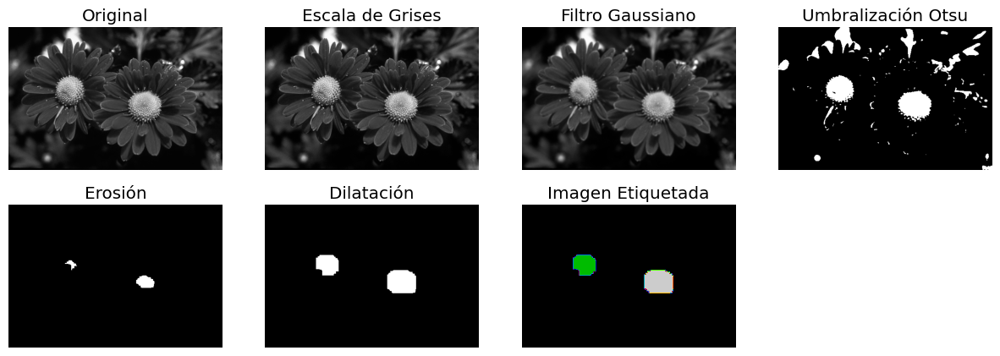

Número de objetos (Característica de Euler): 2
Número de objetos (4-conectividad): 2
Número de objetos (8-conectividad): 2


,ID,Área,Perímetro,Diámetro Equivalente,Distancia Máxima al Centro,Distancia Mínima al Centro
0,1,1977.0,180.041631,50.171651,29.832262,0.523349
1,2,3113.0,216.526912,62.957086,38.238208,0.184323


In [58]:

# Ruta de la imagen
image_path = "./imagenes/124084.png"

# Función para cargar imagen
def read_image(path):
    img = cv2.imread(path)
    if img is not None:
        return img
    else:
        print(f"Error al leer la imagen {path}")
        return None

# Función para convertir imagen a escala de grises
def convert_to_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Función para aplicar filtro gaussiano
def apply_gaussian_filter(image, kernel_size=(5, 5), sigma=0):
    return cv2.GaussianBlur(image, kernel_size, sigma)

# Función para aplicar umbralización Otsu
def aplicar_otsu(imagen):
    _, imagen_otsu = cv2.threshold(imagen, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return imagen_otsu

# Función para aplicar erosión y dilatación
def apply_morphology(image, operation, kernel_size=(3, 3), iterations=1):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel_size)
    morphed_image = cv2.morphologyEx(image, operation, kernel, iterations=iterations)
    return morphed_image

def etiquetar_objetos(imagen_preprocesada):
    labels = measure.label(imagen_preprocesada, connectivity=1)
    euler = measure.euler_number(imagen_preprocesada, connectivity=1)
    num_objects = (len(set(labels.flat)) - 1)
    holes = num_objects - euler
    num_labels_4, labels_im_4 = connected_components(imagen_preprocesada, connectivity=4)
    num_labels_8, labels_im_8 = connected_components(imagen_preprocesada, connectivity=8)
    
    return labels, num_objects, num_labels_4, num_labels_8

def connected_components(image, connectivity):
    # Analizar componentes
    num_labels, labels_im = cv2.connectedComponents(image, connectivity)
    return num_labels, labels_im

def extract_descriptors(label_image):
    properties = regionprops(label_image)
    descriptors = []
    for prop in properties:
        distances = [np.linalg.norm(np.array(prop.centroid) - np.array(coord)) for coord in prop.coords]
        descriptor = {
            'ID': prop.label,
            'Área': prop.area,
            'Perímetro': prop.perimeter,
            'Diámetro Equivalente': prop.equivalent_diameter,
            'Distancia Máxima al Centro': max(distances),
            'Distancia Mínima al Centro': min(distances)
        }
        descriptors.append(descriptor)
    return descriptors

# Leer la imagen "girasoles"
girasoles_image = read_image(image_path)

# Convertir a escala de grises
girasoles_gray = convert_to_grayscale(girasoles_image)

# Aplicar filtro gaussiano
girasoles_gaussian = apply_gaussian_filter(girasoles_gray, kernel_size=(5, 5), sigma=1)

# Aplicar umbralización Otsu
girasoles_otsu = aplicar_otsu(girasoles_gaussian)

# Aplicar erosión
girasoles_erode = apply_morphology(girasoles_otsu, cv2.MORPH_ERODE, kernel_size=(5, 5), iterations=6)

# Aplicar dilatación
girasoles_dilate = apply_morphology(girasoles_erode, cv2.MORPH_DILATE, kernel_size=(5, 5), iterations=6)

# Etiquetar la imagen y contar el número de características
imagen_etiquetada, num_objects, num_labels_4, num_labels_8 = etiquetar_objetos(girasoles_dilate)

# Extraer descriptores
descriptores6 = extract_descriptors(imagen_etiquetada)

# Convertir los descriptores a un DataFrame
df6_descriptores = pd.DataFrame(descriptores6)

# Mostrar imágenes procesadas
plt.figure(figsize=(15, 5))

plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(girasoles_image, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis('off')

plt.subplot(2, 4, 2)
plt.imshow(girasoles_gray, cmap='gray')
plt.title("Escala de Grises")
plt.axis('off')

plt.subplot(2, 4, 3)
plt.imshow(girasoles_gaussian, cmap='gray')
plt.title("Filtro Gaussiano")
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(girasoles_otsu, cmap='gray')
plt.title("Umbralización Otsu")
plt.axis('off')

plt.subplot(2, 4, 5)
plt.imshow(girasoles_erode, cmap='gray')
plt.title("Erosión")
plt.axis('off')

plt.subplot(2, 4, 6)
plt.imshow(girasoles_dilate, cmap='gray')
plt.title("Dilatación")
plt.axis('off')

plt.subplot(2, 4, 7)
plt.imshow(imagen_etiquetada, cmap='nipy_spectral')
plt.title("Imagen Etiquetada")
plt.axis('off')

plt.show()

# Mostrar resultados en una tabla
print(f"Número de objetos (Característica de Euler): {num_objects}")
print(f"Número de objetos (4-conectividad): {num_labels_4-1}")
print(f"Número de objetos (8-conectividad): {num_labels_8-1}")

display(df6_descriptores)  # Mostrar el DataFrame usando display()


#### Creación del dataset

In [61]:

# Crear DataFrames de ejemplo (reemplaza esto con tus datos reales)
df1_descriptores = pd.DataFrame(descriptores1)  # Descriptores para la primera imagen
df2_descriptores = pd.DataFrame(descriptores2)  # Descriptores para la segunda imagen
df3_descriptores = pd.DataFrame(descriptores3)  # Descriptores para la tercera imagen
df4_descriptores = pd.DataFrame(descriptores4)  # Descriptores para la tercera imagen
df5_descriptores = pd.DataFrame(descriptores5)  # Descriptores para la tercera imagen
df6_descriptores = pd.DataFrame(descriptores6)  # Descriptores para la tercera imagen

# Definir rutas para cada archivo CSV
csv_file_path_1 = './datos/descriptores_pills.csv'
csv_file_path_2 = './datos/descriptores_monedas2.csv'
csv_file_path_3 = './datos/descriptores_hoja.csv'
csv_file_path_4 = './datos/descriptores_cell2.csv'
csv_file_path_5 = './datos/descriptores_botones01.csv'
csv_file_path_6 = './datos/descriptores_girasoles.csv'

# Guardar cada DataFrame en un archivo CSV separado
df1_descriptores.to_csv(csv_file_path_1, index=False)
df2_descriptores.to_csv(csv_file_path_2, index=False)
df3_descriptores.to_csv(csv_file_path_3, index=False)
df4_descriptores.to_csv(csv_file_path_4, index=False)
df5_descriptores.to_csv(csv_file_path_5, index=False)
df6_descriptores.to_csv(csv_file_path_6, index=False)

# Imprimir rutas de los archivos guardados
print(f"DataFrames guardados en {csv_file_path_1}, {csv_file_path_2}, {csv_file_path_3}, {csv_file_path_4},{csv_file_path_5},{csv_file_path_6}")


DataFrames guardados en ./datos/descriptores_pills.csv, ./datos/descriptores_monedas2.csv, ./datos/descriptores_hoja.csv, ./datos/descriptores_cell2.csv,./datos/descriptores_botones01.csv,./datos/descriptores_girasoles.csv


#### Visualización del dataset

In [62]:

# Definir rutas para los archivos CSV
csv_file_path_1 = './datos/descriptores_pills.csv'
csv_file_path_2 = './datos/descriptores_monedas2.csv'
csv_file_path_3 = './datos/descriptores_hoja.csv'
csv_file_path_4 = './datos/descriptores_cell2.csv'
csv_file_path_5 = './datos/descriptores_botones01.csv'
csv_file_path_6 = './datos/descriptores_girasoles.csv'

# Leer cada archivo CSV y cargarlo en un DataFrame
df1_descriptores = pd.read_csv(csv_file_path_1)
df2_descriptores = pd.read_csv(csv_file_path_2)
df3_descriptores = pd.read_csv(csv_file_path_3)
df4_descriptores = pd.read_csv(csv_file_path_4)
df5_descriptores = pd.read_csv(csv_file_path_5)
df6_descriptores = pd.read_csv(csv_file_path_6)

# Mostrar los DataFrames en formato de tabla
print("DataFrame 1 (descriptores_pills.csv):")
display(df1_descriptores)  # Muestra el DataFrame en formato de tabla

print("\nDataFrame 2 (descriptores_monedas2.csv):")
display(df2_descriptores)  # Muestra el DataFrame en formato de tabla

print("\nDataFrame 3 (descriptores_hoja.csv):")
display(df3_descriptores)  # Muestra el DataFrame en formato de tabla

print("\nDataFrame 4 (descriptores_cell2.csv):")
display(df4_descriptores)  # Muestra el DataFrame en formato de tabla

print("\nDataFrame 5 (descriptores_botones01.csv):")
display(df5_descriptores)  # Muestra el DataFrame en formato de tabla

print("\nDataFrame 6 (descriptores_girasoles.csv):")
display(df6_descriptores)  # Muestra el DataFrame en formato de tabla


DataFrame 1 (descriptores_pills.csv):


,ID,Área,Perímetro,Diámetro Equivalente,Distancia Máxima al Centro,Distancia Mínima al Centro
0,1,17792.0,523.119841,150.510724,100.145859,0.495990
1,2,17255.0,515.948268,148.221956,98.920234,0.084932
2,3,17794.0,529.504617,150.519183,104.203298,0.351850
3,4,15504.0,499.362482,140.500199,97.012598,0.516486
4,5,17612.0,523.504617,149.747437,99.930408,0.421100
5,6,16101.0,504.190909,143.179712,97.981180,0.333469
6,7,19459.0,552.617316,157.403838,108.884954,0.346901
7,8,17152.0,515.119841,147.778905,97.972719,0.093003



DataFrame 2 (descriptores_monedas2.csv):


,ID,Área,Perímetro,Diámetro Equivalente,Distancia Máxima al Centro,Distancia Mínima al Centro
0,1,30897.0,653.227489,198.341328,101.893303,0.520322
1,2,24320.0,581.286363,175.969275,91.159069,0.508391
2,3,18226.0,503.102597,152.335367,79.040559,0.109296
3,4,41689.0,761.553391,230.391153,119.233807,0.442788
4,5,34054.0,691.955411,208.227999,108.261237,0.423734
5,6,26751.0,611.771645,184.554683,95.858424,0.414299
6,7,46699.0,805.109740,243.842190,125.615912,0.480774
7,8,38234.0,730.097546,220.637804,114.691359,0.160117



DataFrame 3 (descriptores_hoja.csv):


,ID,Área,Perímetro,Diámetro Equivalente,Distancia Máxima al Centro,Distancia Mínima al Centro
0,1,35906.0,721.144228,213.815198,127.860110,0.355124
1,2,41812.0,786.600072,230.730778,149.364081,0.496758
2,3,15604.0,478.409163,140.952580,88.246023,0.354369
3,4,14609.0,459.622366,136.384590,88.499290,0.468573



DataFrame 4 (descriptores_cell2.csv):


,ID,Área,Perímetro,Diámetro Equivalente,Distancia Máxima al Centro,Distancia Mínima al Centro
0,1,25984.0,3455.441051,181.889682,195.156638,0.422396
1,2,1434.0,229.580736,42.729679,51.037583,0.181548
2,3,25305.0,3247.718180,179.497428,203.383991,10.652771
3,4,99.0,61.071068,11.227231,15.834341,0.299985
4,5,17498.0,2346.039897,149.262003,163.845946,1.621877
...,...,...,...,...,...,...
155,156,174.0,60.041631,14.884343,12.997190,0.675037
156,157,49.0,25.207107,7.898654,5.042758,0.606778
157,158,13.0,10.828427,4.068429,2.307692,0.307692
158,159,55.0,36.485281,8.368284,8.274705,0.298204



DataFrame 5 (descriptores_botones01.csv):


,ID,Área,Perímetro,Diámetro Equivalente,Distancia Máxima al Centro,Distancia Mínima al Centro
0,1,10520.0,1498.543289,115.734524,124.317425,0.476225
1,2,3.0,1.000000,1.954410,1.000000,0.000000
2,3,20.0,14.242641,5.046265,2.610077,0.460977
3,4,26.0,16.242641,5.753627,3.168353,0.438529
4,5,30.0,17.656854,6.180387,3.243626,0.504425
5,6,24.0,15.656854,5.527906,3.041667,0.041667
6,7,110.0,60.970563,11.834541,10.430744,1.634974
7,8,27.0,16.828427,5.863230,3.164663,0.447520
8,9,12.0,9.656854,3.908820,1.581139,0.707107
9,10,12.0,9.656854,3.908820,1.581139,0.707107



DataFrame 6 (descriptores_girasoles.csv):


,ID,Área,Perímetro,Diámetro Equivalente,Distancia Máxima al Centro,Distancia Mínima al Centro
0,1,1977.0,180.041631,50.171651,29.832262,0.523349
1,2,3113.0,216.526912,62.957086,38.238208,0.184323


<a id="section11"></a>
## <font color="#8A0883"> Instalación de Paquetes para el Item II</font>

In [2]:
!pip install matplotlib
!pip install seaborn
!pip install scikit-learn
!pip install numpy
!pip install pandas
!pip install ucimlrepo

## ITEM 2 - Reconocimiento de patrones


<a id="section11"></a>
## <font color="#8A0883"> Acceder al Dataset</font>

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from ucimlrepo import fetch_ucirepo

# Fetch dataset
letter_recognition = fetch_ucirepo(id=59)

# Data (as pandas dataframes)
X = letter_recognition.data.features
Y = letter_recognition.data.targets

# Convert to pandas DataFrame
df_letter_recognition = pd.concat([X,Y], axis=1)

# Meta  
print(letter_recognition.metada)

# variable information
print(letter_recognition.variables)

None
     name     role         type demographic                    description  \
0   lettr   Target  Categorical        None                 capital letter   
1   x-box  Feature      Integer        None     horizontal position of box   
2   y-box  Feature      Integer        None       vertical position of box   
3   width  Feature      Integer        None                   width of box   
4    high  Feature      Integer        None                  height of box   
5   onpix  Feature      Integer        None              total # on pixels   
6   x-bar  Feature      Integer        None     mean x of on pixels in box   
7   y-bar  Feature      Integer        None     mean y of on pixels in box   
8   x2bar  Feature      Integer        None                mean x variance   
9   y2bar  Feature      Integer        None                mean y variance   
10  xybar  Feature      Integer        None           mean x y correlation   
11  x2ybr  Feature      Integer        None              me

<a id="section12"></a>
## <font color="#8A0883"> Visualizando el dataset</font>

#### Verificación de los Tipos de Datos en el DataFrame


In [4]:
print(df_letter_recognition.dtypes)

x-box     int64
y-box     int64
width     int64
high      int64
onpix     int64
x-bar     int64
y-bar     int64
x2bar     int64
y2bar     int64
xybar     int64
x2ybr     int64
xy2br     int64
x-ege     int64
xegvy     int64
y-ege     int64
yegvx     int64
lettr    object
dtype: object


#### Información General del DataFrame

In [5]:
df_letter_recognition.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   x-box   20000 non-null  int64 
 1   y-box   20000 non-null  int64 
 2   width   20000 non-null  int64 
 3   high    20000 non-null  int64 
 4   onpix   20000 non-null  int64 
 5   x-bar   20000 non-null  int64 
 6   y-bar   20000 non-null  int64 
 7   x2bar   20000 non-null  int64 
 8   y2bar   20000 non-null  int64 
 9   xybar   20000 non-null  int64 
 10  x2ybr   20000 non-null  int64 
 11  xy2br   20000 non-null  int64 
 12  x-ege   20000 non-null  int64 
 13  xegvy   20000 non-null  int64 
 14  y-ege   20000 non-null  int64 
 15  yegvx   20000 non-null  int64 
 16  lettr   20000 non-null  object
dtypes: int64(16), object(1)
memory usage: 2.6+ MB


In [6]:
df_letter_recognition.describe()

,x-box,y-box,width,high,onpix,x-bar,y-bar,x2bar,y2bar,xybar,x2ybr,xy2br,x-ege,xegvy,y-ege,yegvx
count,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000
mean,4.023550,7.035500,5.121850,5.37245,3.505850,6.897600,7.500450,4.628600,5.178650,8.282050,6.45400,7.929000,3.046100,8.338850,3.691750,7.80120
std,1.913212,3.304555,2.014573,2.26139,2.190458,2.026035,2.325354,2.699968,2.380823,2.488475,2.63107,2.080619,2.332541,1.546722,2.567073,1.61747
min,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000
25%,3.000000,5.000000,4.000000,4.00000,2.000000,6.000000,6.000000,3.000000,4.000000,7.000000,5.00000,7.000000,1.000000,8.000000,2.000000,7.00000
50%,4.000000,7.000000,5.000000,6.00000,3.000000,7.000000,7.000000,4.000000,5.000000,8.000000,6.00000,8.000000,3.000000,8.000000,3.000000,8.00000
75%,5.000000,9.000000,6.000000,7.00000,5.000000,8.000000,9.000000,6.000000,7.000000,10.000000,8.00000,9.000000,4.000000,9.000000,5.000000,9.00000
max,15.000000,15.000000,15.000000,15.00000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.00000,15.000000,15.000000,15.000000,15.000000,15.00000


In [7]:
print(df_letter_recognition.columns)

Index(['x-box', 'y-box', 'width', 'high', 'onpix', 'x-bar', 'y-bar', 'x2bar',
       'y2bar', 'xybar', 'x2ybr', 'xy2br', 'x-ege', 'xegvy', 'y-ege', 'yegvx',
       'lettr'],
      dtype='object')


In [8]:
df_letter_recognition.groupby('lettr').size()

lettr
A    789
B    766
C    736
D    805
E    768
F    775
G    773
H    734
I    755
J    747
K    739
L    761
M    792
N    783
O    753
P    803
Q    783
R    758
S    748
T    796
U    813
V    764
W    752
X    787
Y    786
Z    734
dtype: int64

#### Actualización del DataFrame

In [9]:
# Asignamos números a cada letra de la columna 'target'
target_map = {
    "lettr": {
        "A": 0, "B": 1, "C": 2, "D": 3, "E": 4, "F": 5, "G": 6,
        "H": 7, "I": 8, "J": 9, "K": 10, "L": 11, "M": 12, "N": 13,
        "O": 14, "P": 15, "Q": 16, "R": 17, "S": 18, "T": 19, "U": 20,
        "V": 21, "W": 22, "X": 23, "Y": 24, "Z": 25
    }

}

# Reemplazamos los valores en el DataFrame
pd.set_option('future.no_silent_downcasting', True)
data = df_letter_recognition.replace(target_map)

# Mostramos las primeras filas del DataFrame resultante
data.head(-1)


,x-box,y-box,width,high,onpix,x-bar,y-bar,x2bar,y2bar,xybar,x2ybr,xy2br,x-ege,xegvy,y-ege,yegvx,lettr
0,2,8,3,5,1,8,13,0,6,6,10,8,0,8,0,8,19
1,5,12,3,7,2,10,5,5,4,13,3,9,2,8,4,10,8
2,4,11,6,8,6,10,6,2,6,10,3,7,3,7,3,9,3
3,7,11,6,6,3,5,9,4,6,4,4,10,6,10,2,8,13
4,2,1,3,1,1,8,6,6,6,6,5,9,1,7,5,10,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19994,5,8,7,7,7,7,9,4,8,7,7,8,3,10,8,6,19
19995,2,2,3,3,2,7,7,7,6,6,6,4,2,8,3,7,3
19996,7,10,8,8,4,4,8,6,9,12,9,13,2,9,3,7,2
19997,6,9,6,7,5,6,11,3,7,11,9,5,2,12,2,4,19


#### Visualización de Distribuciones de Características en el DataFrame

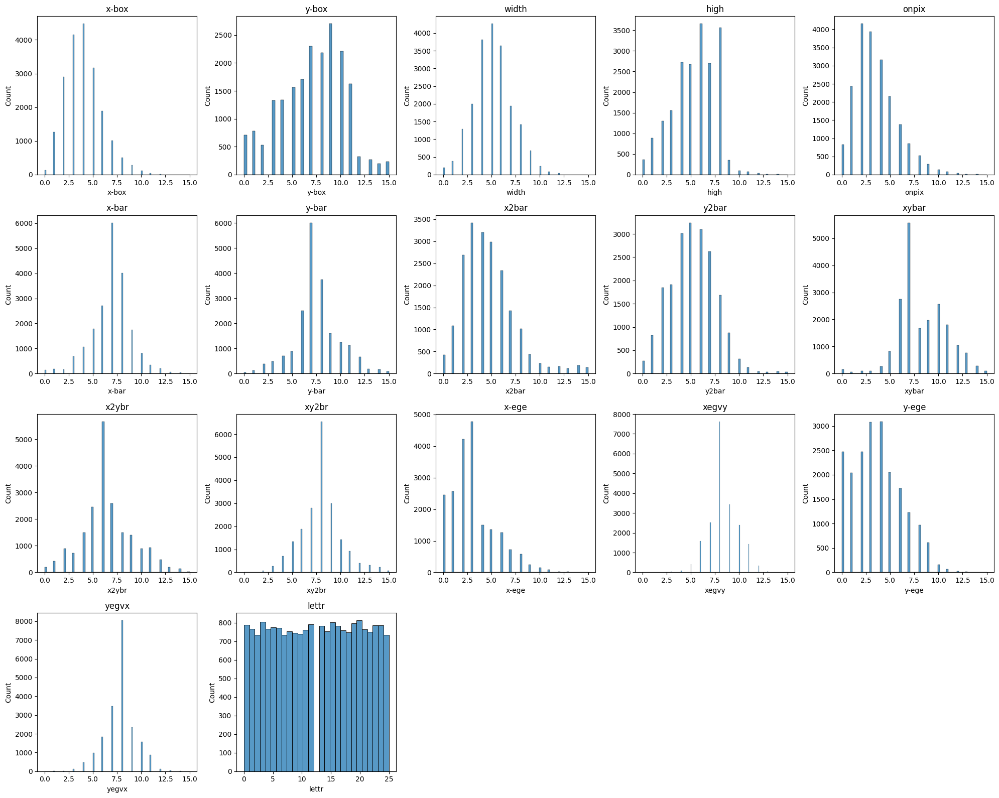

In [10]:
%matplotlib inline

# Suponiendo que df_letter_recognition es el DataFrame que contiene los datos
# Mapeo de letras a números
target_map = {
    "lettr": {
        "A": 0, "B": 1, "C": 2, "D": 3, "E": 4, "F": 5, "G": 6,
        "H": 7, "I": 8, "J": 9, "K": 10, "L": 11, "M": 12, "N": 13,
        "O": 14, "P": 15, "Q": 16, "R": 17, "S": 18, "T": 19, "U": 20,
        "V": 21, "W": 22, "X": 23, "Y": 24, "Z": 25
    }
}

# Reemplazar los valores en el DataFrame
data = df_letter_recognition.replace(target_map)

# Lista de nombres de columnas que quieres graficar
names = ['x-box', 'y-box', 'width', 'high', 'onpix', 'x-bar', 'y-bar', 'x2bar', 'y2bar', 'xybar',
         'x2ybr', 'xy2br', 'x-ege', 'xegvy', 'y-ege', 'yegvx', 'lettr']

# Crear subplots
f, axes = plt.subplots(4, 5, figsize=(20, 16))  # Ajusta el tamaño si es necesario
axes = axes.flatten()  # Hacer un array unidimensional de los ejes

# Graficar usando un bucle
for i, col in enumerate(names):
    sns.histplot(data[col], ax=axes[i])
    axes[i].set_title(col)  # Establecer el título para cada subplot

# Si hay más ejes que columnas, ocultar los ejes vacíos
for j in range(len(names), len(axes)):
    axes[j].axis('off')

# Mostrar las gráficas
plt.tight_layout()
plt.show()


#### Configuración de Ancho de Visualización y Cálculo de Correlaciones

In [11]:
pd.set_option('display.width', 100)
data.corr ( method= 'pearson')


,x-box,y-box,width,high,onpix,x-bar,y-bar,x2bar,y2bar,xybar,x2ybr,xy2br,x-ege,xegvy,y-ege,yegvx,lettr
x-box,1.000000,0.757793,0.851514,0.672764,0.619097,-0.032595,0.045545,0.014306,0.052086,0.148056,0.035464,-0.046333,0.489155,0.098180,0.273504,-0.105147,0.105349
y-box,0.757793,1.000000,0.671912,0.823207,0.555067,0.045690,-0.040925,-0.025019,0.096478,0.159954,-0.054648,-0.007568,0.274431,-0.001336,0.230883,-0.042741,0.001547
width,0.851514,0.671912,1.000000,0.660215,0.765716,0.061959,0.024832,-0.098611,0.057074,0.115018,0.011694,-0.045009,0.557251,0.045658,0.260285,-0.118273,0.096817
high,0.672764,0.823207,0.660215,1.000000,0.644366,0.042844,-0.020072,0.082383,0.059032,0.012458,-0.011991,0.026386,0.265243,0.025359,0.297545,-0.018853,0.041672
onpix,0.619097,0.555067,0.765716,0.644366,1.000000,0.139159,-0.028822,-0.011985,-0.065557,-0.069776,-0.072941,-0.038858,0.627507,0.017649,0.492653,-0.062969,-0.002665
x-bar,-0.032595,0.045690,0.061959,0.042844,0.139159,1.000000,-0.356580,-0.053306,-0.122851,0.085963,-0.341957,-0.032115,0.144325,-0.253339,0.127056,0.248816,-0.049637
y-bar,0.045545,-0.040925,0.024832,-0.020072,-0.028822,-0.356580,1.000000,-0.118625,-0.049658,0.178318,0.600397,-0.271649,-0.036722,0.555060,-0.078008,-0.207900,0.308919
x2bar,0.014306,-0.025019,-0.098611,0.082383,-0.011985,-0.053306,-0.118625,1.000000,-0.188431,-0.317780,0.042545,0.082020,0.142132,-0.084820,0.006546,0.182902,-0.109954
y2bar,0.052086,0.096478,0.057074,0.059032,-0.065557,-0.122851,-0.049658,-0.188431,1.000000,0.132000,-0.060116,0.119048,-0.384018,-0.052545,0.277540,-0.061335,0.012275
xybar,0.148056,0.159954,0.115018,0.012458,-0.069776,0.085963,0.178318,-0.317780,0.132000,1.000000,0.057988,-0.106759,-0.175676,0.029419,-0.087019,-0.114223,-0.077303


## Visualización de la Matriz de Correlación con un Mapa de Calor

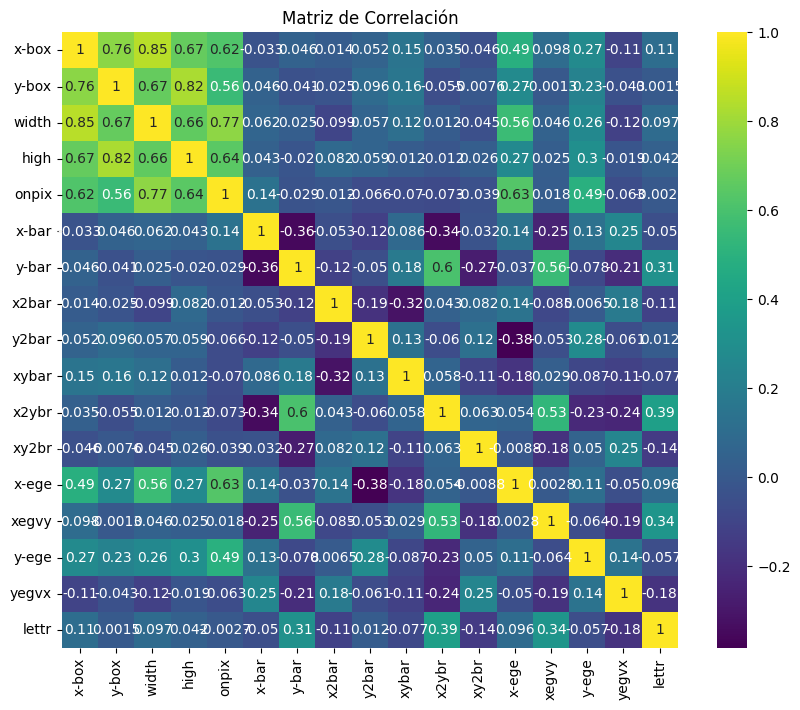

In [12]:
# Suponiendo que data es el DataFrame con los datos

# Calcular la matriz de correlación
correlation = data.corr(method='pearson')

# Crear la figura y el mapa de calor
fig = plt.figure(figsize=(10, 8))  # Ajusta el tamaño de la figura según sea necesario
ax = sns.heatmap(correlation, vmax=1, square=True, annot=True, cmap='viridis')

# Ajustar los títulos y mostrar el gráfico
plt.title('Matriz de Correlación')
plt.show()


## Gráficos de Dispersión para la Exploración de Relaciones entre Características

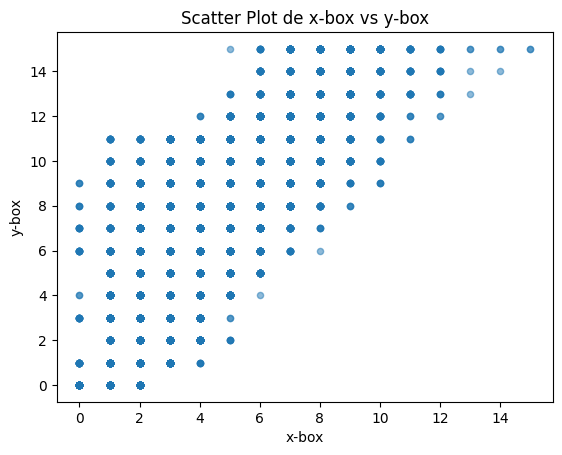

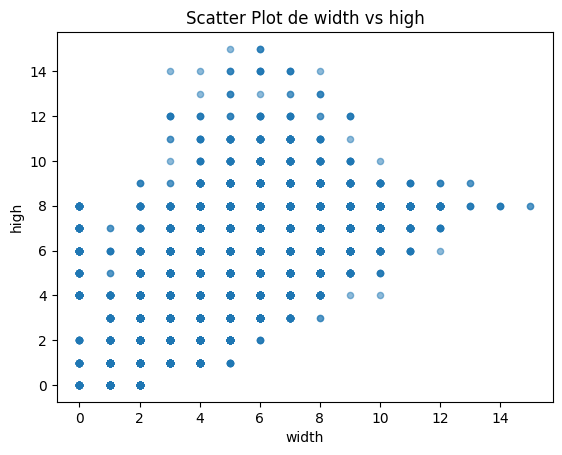

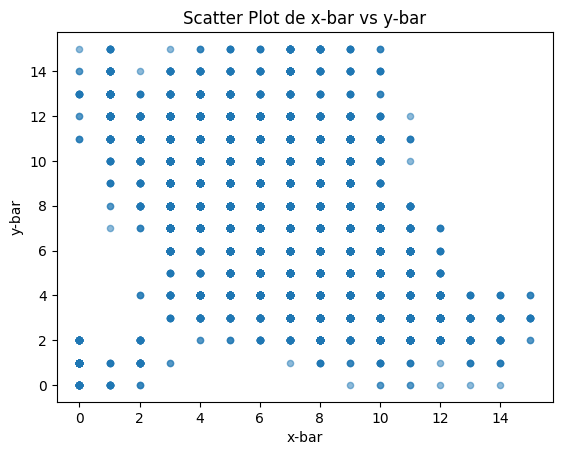

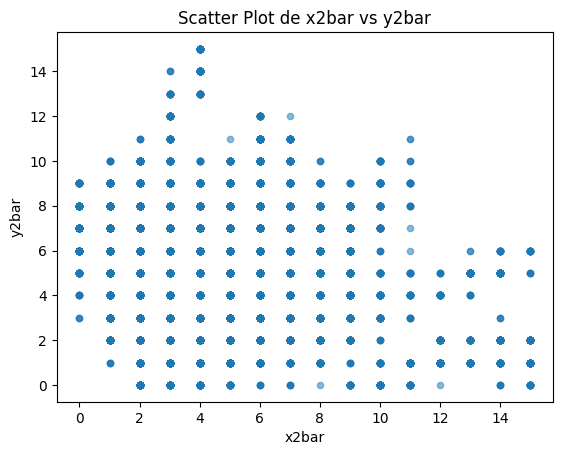

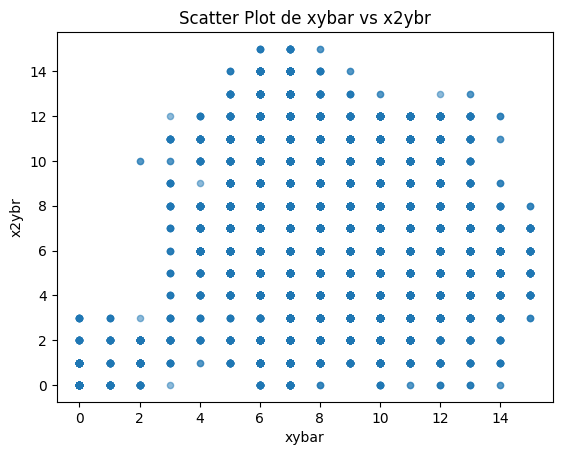

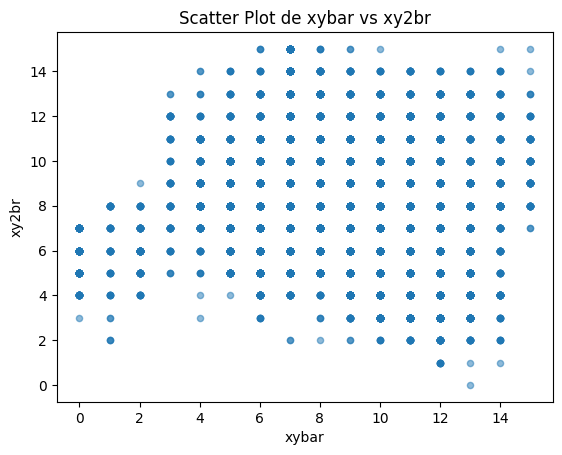

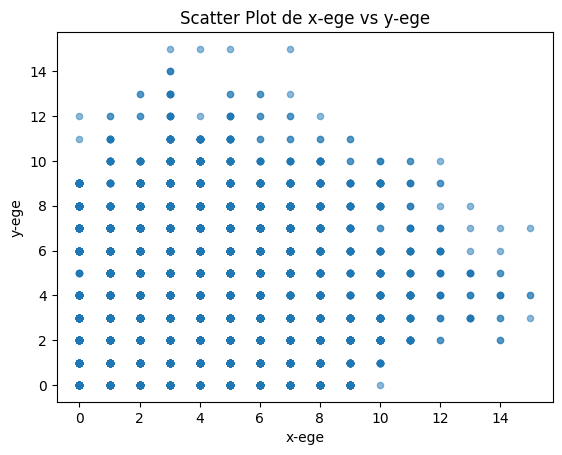

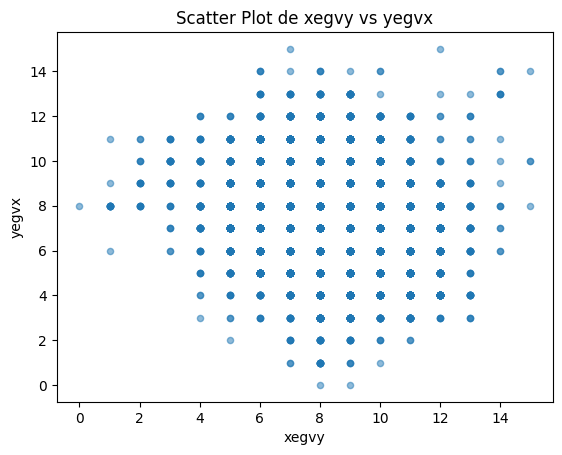

In [13]:
'''
import matplotlib.pyplot as plt
'''
# Graficar 'x-box' frente a 'y-box'
df_letter_recognition.plot(kind="scatter", x="x-box", y="y-box", alpha=0.5)
plt.title('Scatter Plot de x-box vs y-box')
plt.xlabel('x-box')
plt.ylabel('y-box')
plt.show()

# Graficar 'width' frente a 'high'
df_letter_recognition.plot(kind="scatter", x="width", y="high", alpha=0.5)
plt.title('Scatter Plot de width vs high')
plt.xlabel('width')
plt.ylabel('high')
plt.show()

# Graficar 'x-bar' frente a 'y-bar'
df_letter_recognition.plot(kind="scatter", x="x-bar", y="y-bar", alpha=0.5)
plt.title('Scatter Plot de x-bar vs y-bar')
plt.xlabel('x-bar')
plt.ylabel('y-bar')
plt.show()

# Graficar 'x2bar' frente a 'y2bar'
df_letter_recognition.plot(kind="scatter", x="x2bar", y="y2bar", alpha=0.5)
plt.title('Scatter Plot de x2bar vs y2bar')
plt.xlabel('x2bar')
plt.ylabel('y2bar')
plt.show()

# Graficar 'xybar' frente a 'x2ybr'
df_letter_recognition.plot(kind="scatter", x="xybar", y="x2ybr", alpha=0.5)
plt.title('Scatter Plot de xybar vs x2ybr')
plt.xlabel('xybar')
plt.ylabel('x2ybr')
plt.show()

# Graficar 'xybar' frente a 'xy2br'
df_letter_recognition.plot(kind="scatter", x="xybar", y="xy2br", alpha=0.5)
plt.title('Scatter Plot de xybar vs xy2br')
plt.xlabel('xybar')
plt.ylabel('xy2br')
plt.show()

# Graficar 'x-ege' frente a 'y-ege'
df_letter_recognition.plot(kind="scatter", x="x-ege", y="y-ege", alpha=0.5)
plt.title('Scatter Plot de x-ege vs y-ege')
plt.xlabel('x-ege')
plt.ylabel('y-ege')
plt.show()

# Graficar 'xegvy' frente a 'yegvx'
df_letter_recognition.plot(kind="scatter", x="xegvy", y="yegvx", alpha=0.5)
plt.title('Scatter Plot de xegvy vs yegvx')
plt.xlabel('xegvy')
plt.ylabel('yegvx')
plt.show()


## Creación de Gráficos de Dispersión con FacetGrid para Visualizar Relaciones entre Características


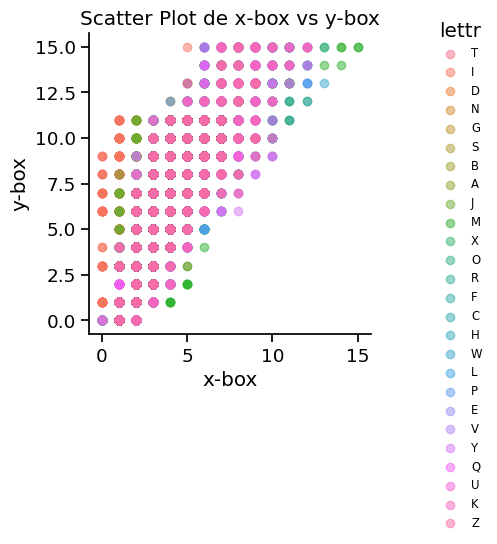

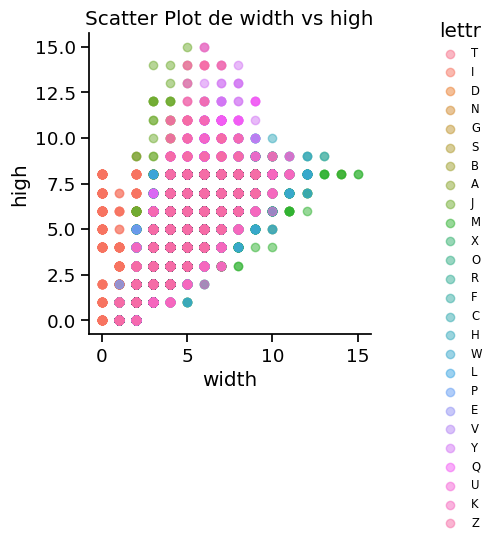

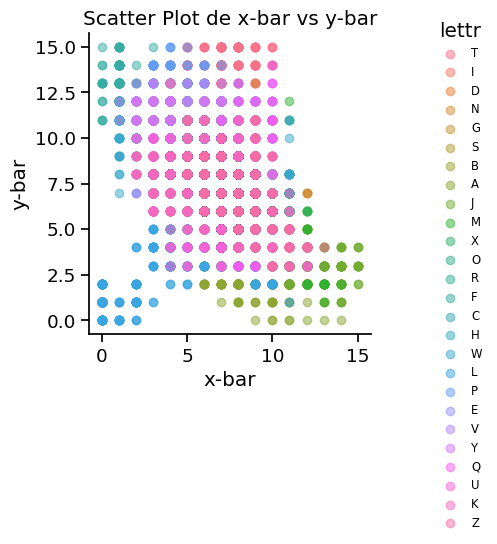

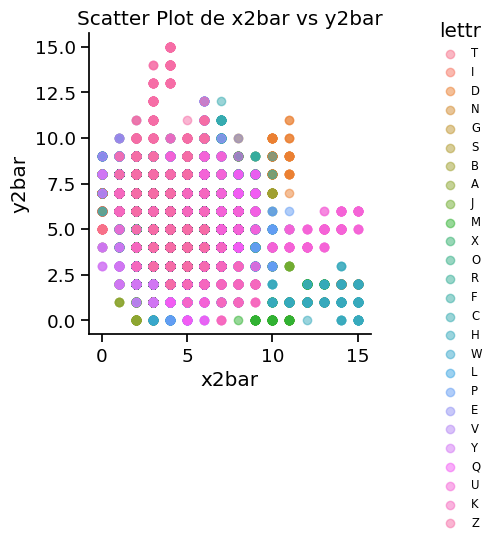

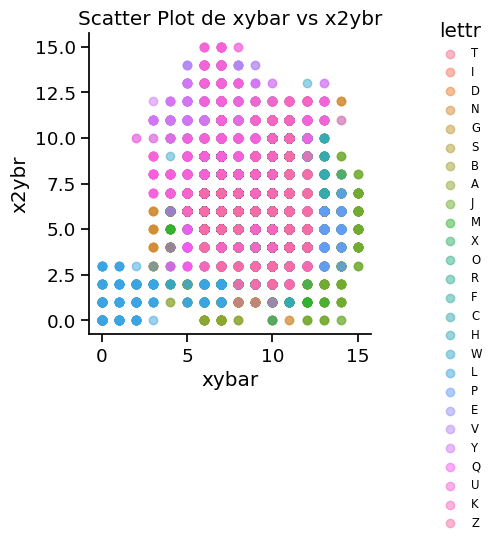

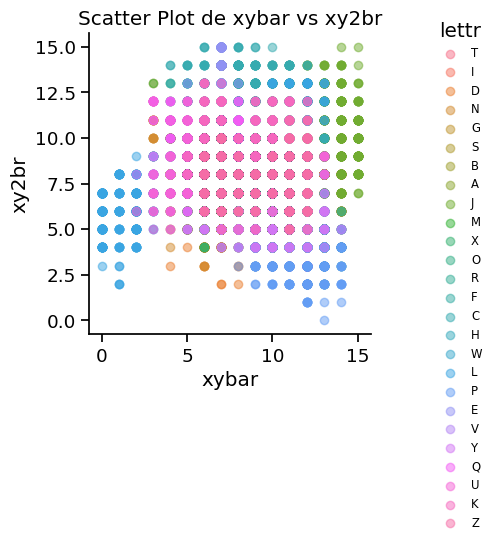

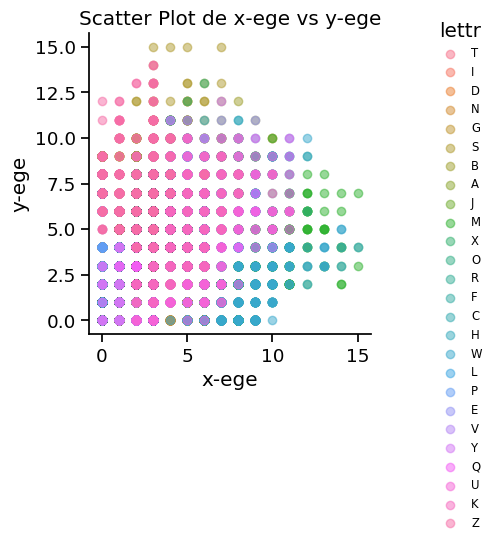

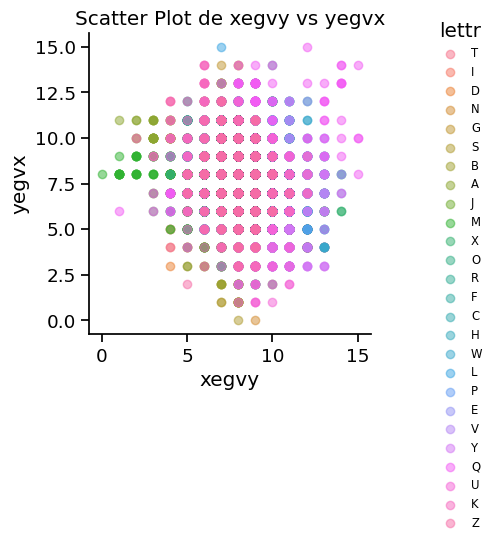

In [14]:
# Configuración de tamaño de gráficos
sns.set_context("notebook", font_scale=1.2)

# Función para crear y ajustar los gráficos
def create_facet_grid(x_col, y_col, title):
    g = sns.FacetGrid(df_letter_recognition, height=4, hue="lettr")
    g.map(plt.scatter, x_col, y_col, alpha=0.5)
    g.add_legend(fontsize='xx-small', bbox_to_anchor=(1, 1), loc='upper left')
    plt.title(title)
    plt.show()

# Graficar 'x-box' frente a 'y-box'
create_facet_grid("x-box", "y-box", 'Scatter Plot de x-box vs y-box')

# Graficar 'width' frente a 'high'
create_facet_grid("width", "high", 'Scatter Plot de width vs high')

# Graficar 'x-bar' frente a 'y-bar'
create_facet_grid("x-bar", "y-bar", 'Scatter Plot de x-bar vs y-bar')

# Graficar 'x2bar' frente a 'y2bar'
create_facet_grid("x2bar", "y2bar", 'Scatter Plot de x2bar vs y2bar')

# Graficar 'xybar' frente a 'x2ybr'
create_facet_grid("xybar", "x2ybr", 'Scatter Plot de xybar vs x2ybr')

# Graficar 'xybar' frente a 'xy2br'
create_facet_grid("xybar", "xy2br", 'Scatter Plot de xybar vs xy2br')

# Graficar 'x-ege' frente a 'y-ege'
create_facet_grid("x-ege", "y-ege", 'Scatter Plot de x-ege vs y-ege')

# Graficar 'xegvy' frente a 'yegvx'
create_facet_grid("xegvy", "yegvx", 'Scatter Plot de xegvy vs yegvx')


## Creación de Gráficos de Dispersión con FacetGrid y Transparencia para Visualizar Relaciones entre Características

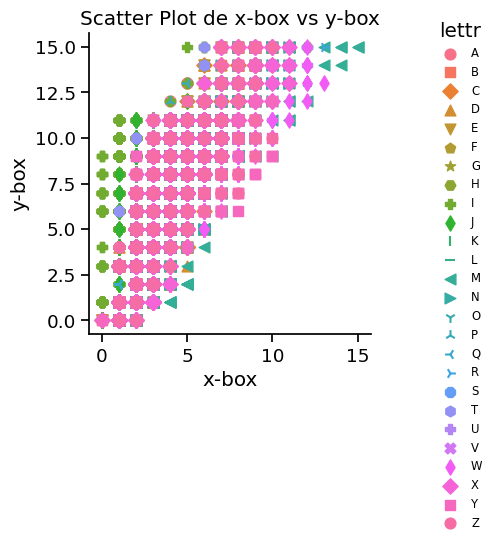

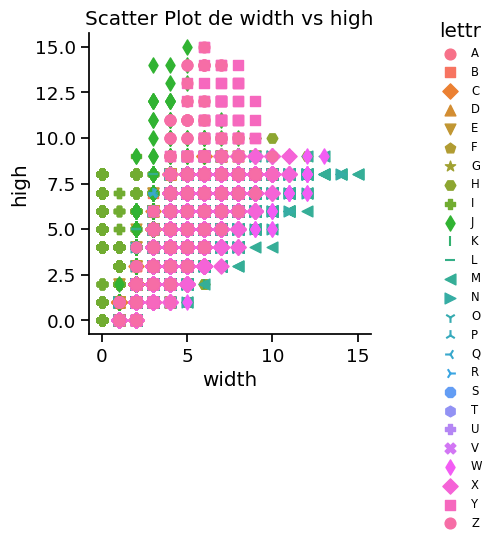

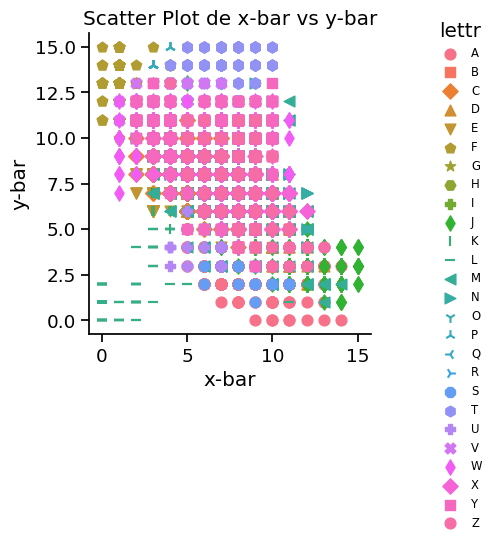

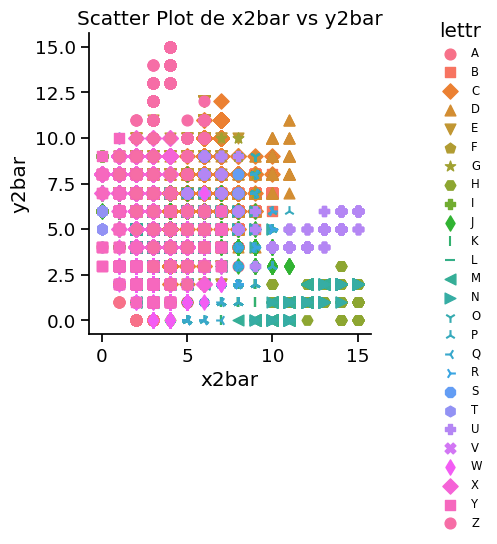

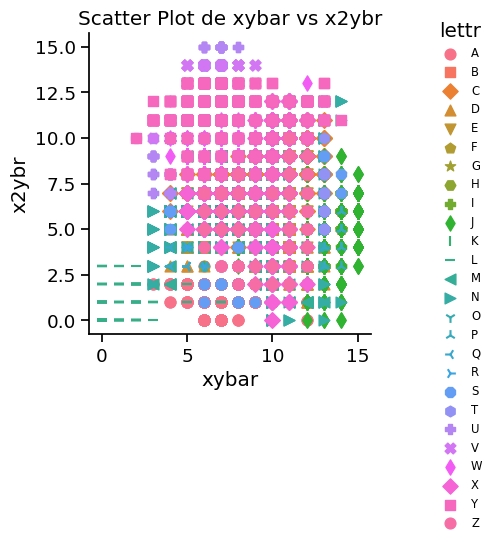

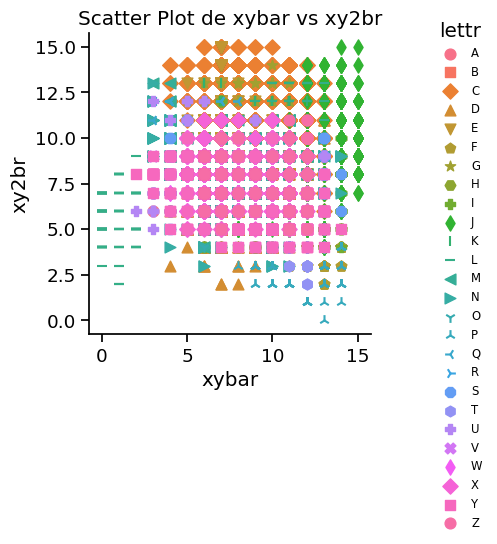

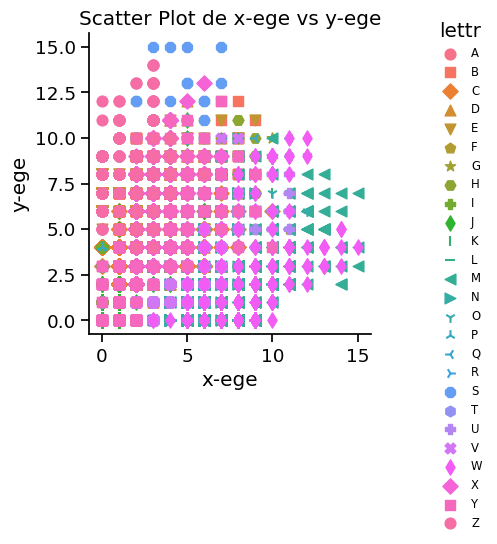

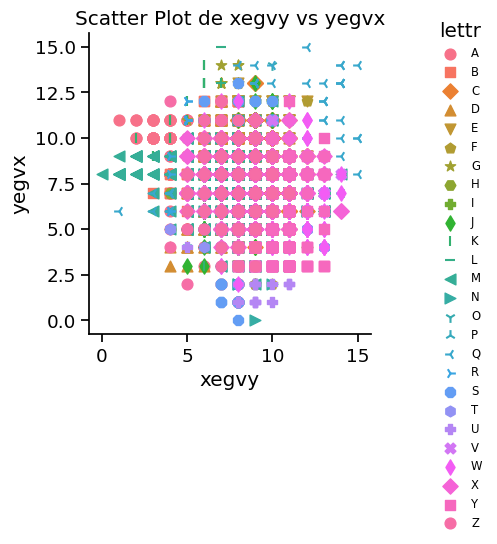

In [15]:
# Definición del orden de las clases y marcadores
hue_order = [
    "A", "B", "C", "D", "E", "F", "G", "H", "I", "J", 
    "K", "L", "M", "N", "O", "P", "Q", "R", "S", "T", 
    "U", "V", "W", "X", "Y", "Z"
]
hue_kws = dict(marker=["o", "s", "D", "^", "v", "p", "*", "H", "P", "d", "|", "_", "<", ">", "1", "2", "3", "4", "8", "h", "P", "X", "d", "D", ",", "o"])

# Función para crear y ajustar los gráficos
def create_facet_grid(x_col, y_col, title):
    g = sns.FacetGrid(df_letter_recognition, height=4, hue="lettr", hue_order=hue_order, hue_kws=hue_kws)
    g.map(plt.scatter, x_col, y_col, s=60)
    g.add_legend(fontsize='xx-small', bbox_to_anchor=(1, 1), loc='upper left')
    plt.title(title)
    plt.show()

# Graficar 'x-box' frente a 'y-box'
create_facet_grid("x-box", "y-box", 'Scatter Plot de x-box vs y-box')

# Graficar 'width' frente a 'high'
create_facet_grid("width", "high", 'Scatter Plot de width vs high')

# Graficar 'x-bar' frente a 'y-bar'
create_facet_grid("x-bar", "y-bar", 'Scatter Plot de x-bar vs y-bar')

# Graficar 'x2bar' frente a 'y2bar'
create_facet_grid("x2bar", "y2bar", 'Scatter Plot de x2bar vs y2bar')

# Graficar 'xybar' frente a 'x2ybr'
create_facet_grid("xybar", "x2ybr", 'Scatter Plot de xybar vs x2ybr')

# Graficar 'xybar' frente a 'xy2br'
create_facet_grid("xybar", "xy2br", 'Scatter Plot de xybar vs xy2br')

# Graficar 'x-ege' frente a 'y-ege'
create_facet_grid("x-ege", "y-ege", 'Scatter Plot de x-ege vs y-ege')

# Graficar 'xegvy' frente a 'yegvx'
create_facet_grid("xegvy", "yegvx", 'Scatter Plot de xegvy vs yegvx')


## Creación de Gráficos de Dispersión con FacetGrid y Transparencia, Personalizados con Marcadores para Diferentes Clases


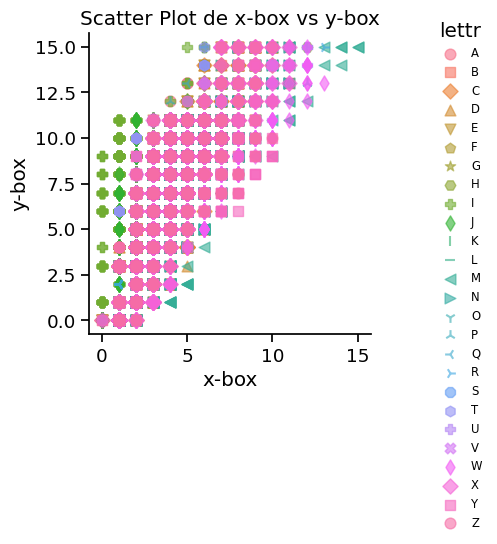

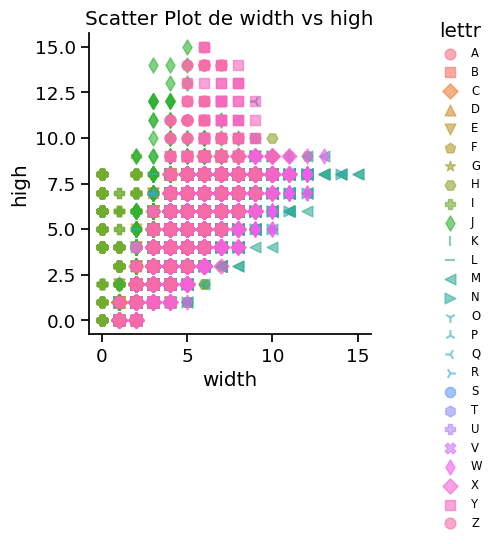

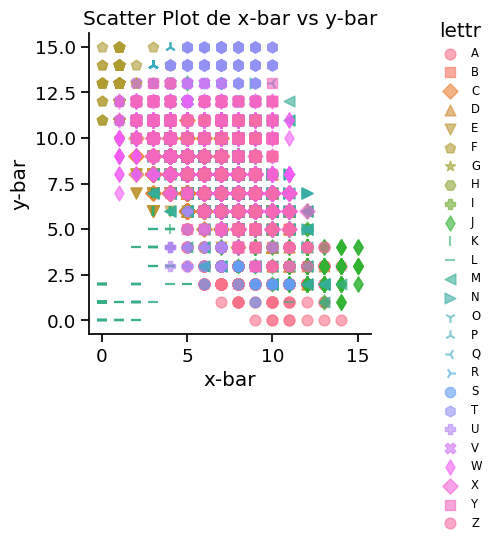

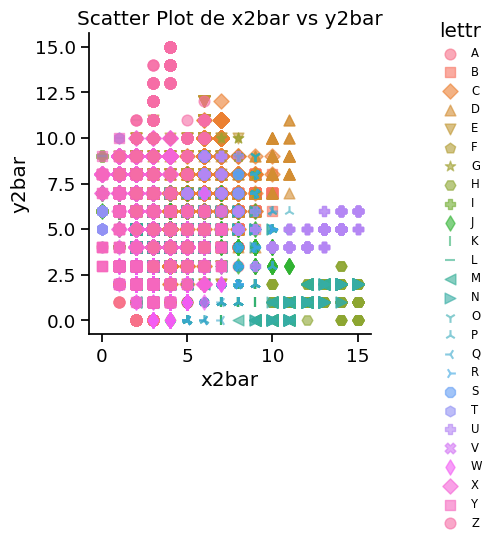

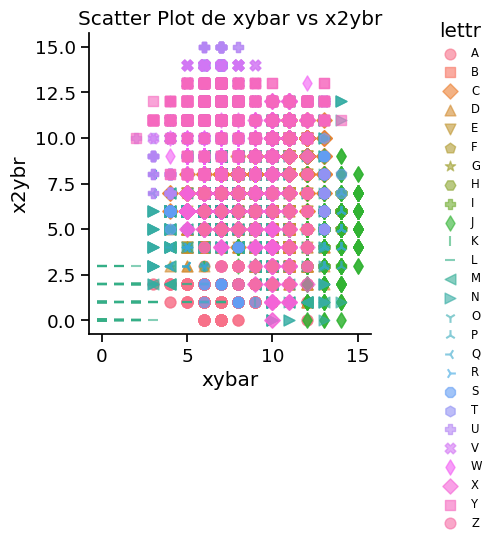

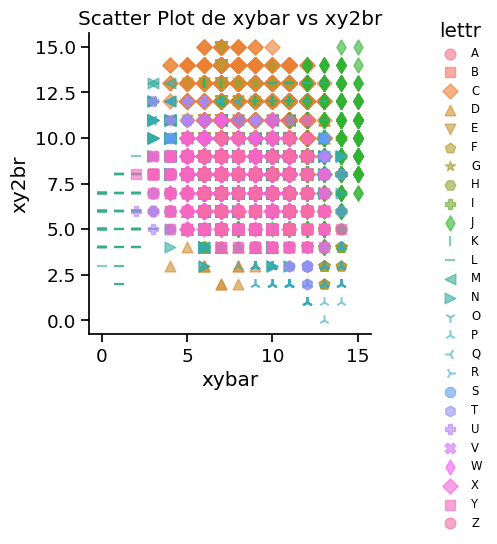

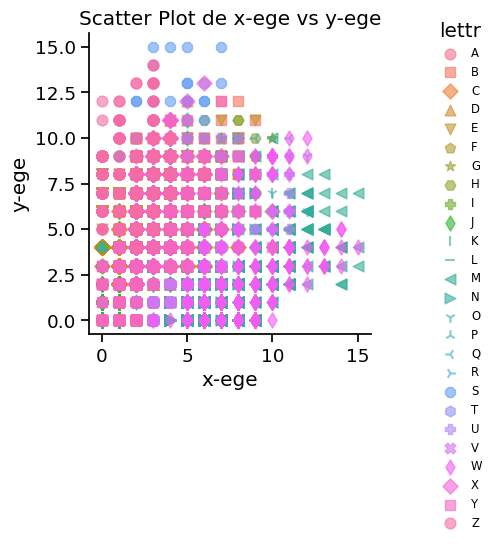

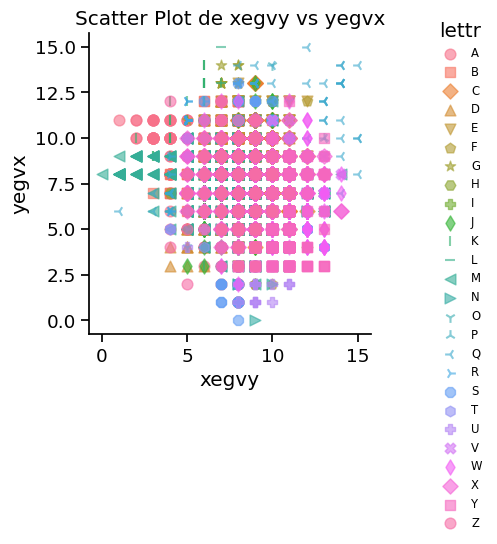

In [16]:
# Definición del orden de las clases y marcadores
hue_order = [
    "A", "B", "C", "D", "E", "F", "G", "H", "I", "J", 
    "K", "L", "M", "N", "O", "P", "Q", "R", "S", "T", 
    "U", "V", "W", "X", "Y", "Z"
]
hue_kws = dict(marker=["o", "s", "D", "^", "v", "p", "*", "H", "P", "d", "|", "_", "<", ">", "1", "2", "3", "4", "8", "h", "P", "X", "d", "D", ",", "o"])

# Función para crear y ajustar los gráficos
def create_facet_grid(x_col, y_col, title):
    g = sns.FacetGrid(df_letter_recognition, height=4, hue="lettr", hue_order=hue_order, hue_kws=hue_kws)
    g.map(plt.scatter, x_col, y_col, s=60, alpha=0.6)  # Agregar transparencia
    g.add_legend(fontsize='xx-small', bbox_to_anchor=(1, 1), loc='upper left')
    plt.title(title)
    plt.show()

# Graficar 'x-box' frente a 'y-box'
create_facet_grid("x-box", "y-box", 'Scatter Plot de x-box vs y-box')

# Graficar 'width' frente a 'high'
create_facet_grid("width", "high", 'Scatter Plot de width vs high')

# Graficar 'x-bar' frente a 'y-bar'
create_facet_grid("x-bar", "y-bar", 'Scatter Plot de x-bar vs y-bar')

# Graficar 'x2bar' frente a 'y2bar'
create_facet_grid("x2bar", "y2bar", 'Scatter Plot de x2bar vs y2bar')

# Graficar 'xybar' frente a 'x2ybr'
create_facet_grid("xybar", "x2ybr", 'Scatter Plot de xybar vs x2ybr')

# Graficar 'xybar' frente a 'xy2br'
create_facet_grid("xybar", "xy2br", 'Scatter Plot de xybar vs xy2br')

# Graficar 'x-ege' frente a 'y-ege'
create_facet_grid("x-ege", "y-ege", 'Scatter Plot de x-ege vs y-ege')

# Graficar 'xegvy' frente a 'yegvx'
create_facet_grid("xegvy", "yegvx", 'Scatter Plot de xegvy vs yegvx')


## Gráfico de Pares (Pairplot) con Seaborn para Visualizar Relaciones entre Características


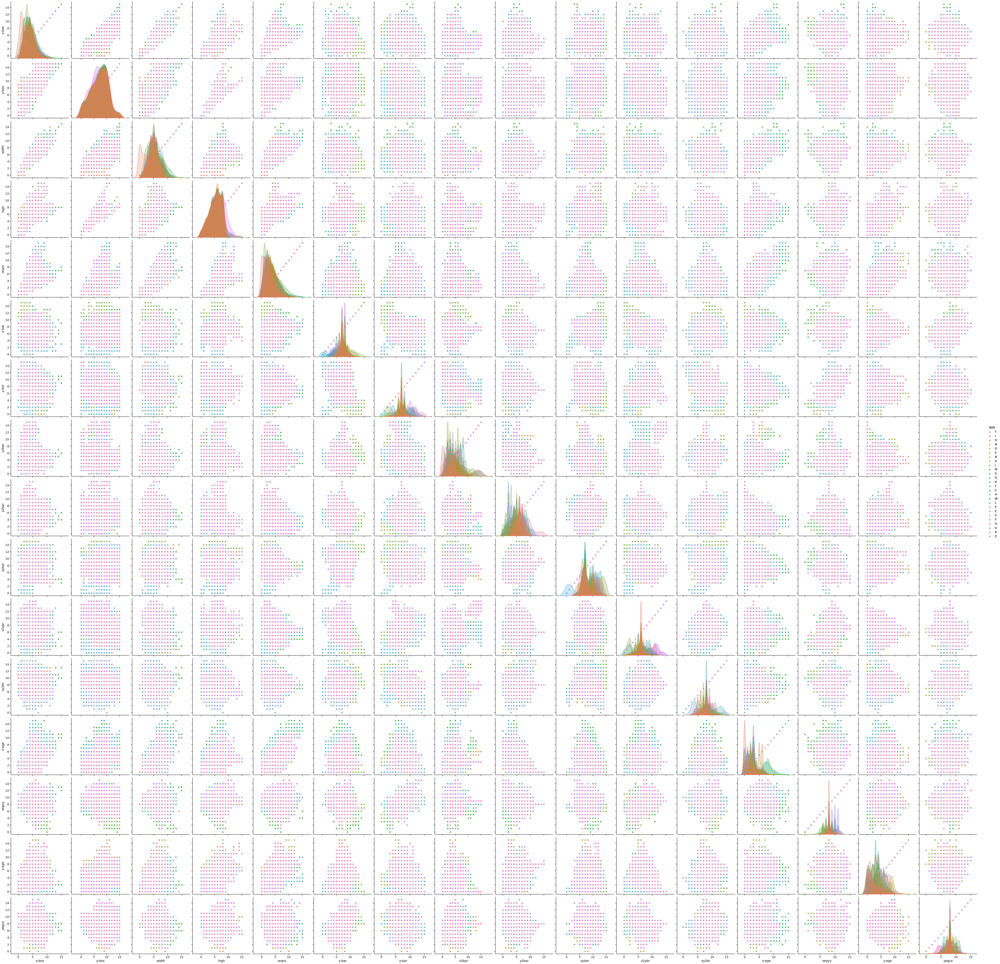

In [17]:
g=sns.pairplot(df_letter_recognition, hue='lettr', height=4)
g.map(plt.scatter, s=50, edgecolor="white")
g.add_legend()
plt.show()


<a id="section141"></a>
### <font color="#8A0883"> Escalamiento</font>

### Escalado de Datos con MinMaxScaler y Conversión a DataFrame


In [18]:
from sklearn.preprocessing import MinMaxScaler

# Suponiendo que `data` y `names` ya están definidos
array = data.values

# Separando en input y target
X = array[:, 0:16]  # Ajustando para incluir todas las columnas excepto la última
Y = array[:, 16]    # Columna objetivo 'lettr'

# Escalando los valores
scaler = MinMaxScaler(feature_range=(0, 1))
rescaledX = scaler.fit_transform(X)

# Imprimir los nombres de las columnas
print(names)

# Convertir el Numpy Array a DataFrame con todas las columnas
transform_df = pd.DataFrame(rescaledX, columns=names[:16])  # Incluyendo todas las columnas menos la última
transform_df['lettr'] = Y  # Añadiendo la columna de target 'lettr'
transform_df.head()


['x-box', 'y-box', 'width', 'high', 'onpix', 'x-bar', 'y-bar', 'x2bar', 'y2bar', 'xybar', 'x2ybr', 'xy2br', 'x-ege', 'xegvy', 'y-ege', 'yegvx', 'lettr']


,x-box,y-box,width,high,onpix,x-bar,y-bar,x2bar,y2bar,xybar,x2ybr,xy2br,x-ege,xegvy,y-ege,yegvx,lettr
0,0.133333,0.533333,0.2,0.333333,0.066667,0.533333,0.866667,0.000000,0.400000,0.400000,0.666667,0.533333,0.000000,0.533333,0.000000,0.533333,19
1,0.333333,0.800000,0.2,0.466667,0.133333,0.666667,0.333333,0.333333,0.266667,0.866667,0.200000,0.600000,0.133333,0.533333,0.266667,0.666667,8
2,0.266667,0.733333,0.4,0.533333,0.400000,0.666667,0.400000,0.133333,0.400000,0.666667,0.200000,0.466667,0.200000,0.466667,0.200000,0.600000,3
3,0.466667,0.733333,0.4,0.400000,0.200000,0.333333,0.600000,0.266667,0.400000,0.266667,0.266667,0.666667,0.400000,0.666667,0.133333,0.533333,13
4,0.133333,0.066667,0.2,0.066667,0.066667,0.533333,0.400000,0.400000,0.400000,0.400000,0.333333,0.600000,0.066667,0.466667,0.333333,0.666667,6


In [19]:
print(transform_df)

          x-box     y-box     width      high     onpix     x-bar     y-bar     x2bar     y2bar  \
0      0.133333  0.533333  0.200000  0.333333  0.066667  0.533333  0.866667  0.000000  0.400000   
1      0.333333  0.800000  0.200000  0.466667  0.133333  0.666667  0.333333  0.333333  0.266667   
2      0.266667  0.733333  0.400000  0.533333  0.400000  0.666667  0.400000  0.133333  0.400000   
3      0.466667  0.733333  0.400000  0.400000  0.200000  0.333333  0.600000  0.266667  0.400000   
4      0.133333  0.066667  0.200000  0.066667  0.066667  0.533333  0.400000  0.400000  0.400000   
...         ...       ...       ...       ...       ...       ...       ...       ...       ...   
19995  0.133333  0.133333  0.200000  0.200000  0.133333  0.466667  0.466667  0.466667  0.400000   
19996  0.466667  0.666667  0.533333  0.533333  0.266667  0.266667  0.533333  0.400000  0.600000   
19997  0.400000  0.600000  0.400000  0.466667  0.333333  0.400000  0.733333  0.200000  0.466667   
19998  0.1

<a id="section142"></a>
### <font color="#8A0883"> Estandarizacion</font>

In [20]:
from sklearn.preprocessing import StandardScaler
#Vamos a estandarizar los valores del patron de entrada
scaler=StandardScaler().fit(X)
standardrizedX=scaler.transform(X)
# Convertimos el Numpy Array a dataframe
transform_df=pd.DataFrame(standardrizedX , columns=names[0:16])
transform_df.head()

,x-box,y-box,width,high,onpix,x-bar,y-bar,x2bar,y2bar,xybar,x2ybr,xy2br,x-ege,xegvy,y-ege,yegvx
0,-1.057698,0.291877,-1.053277,-0.164704,-1.144013,0.544130,2.365097,-1.714360,0.344994,-0.917071,1.347774,0.034125,-1.305948,-0.219082,-1.438153,0.122911
1,0.510385,1.502358,-1.053277,0.719730,-0.687476,1.531305,-1.075326,0.137561,-0.495072,1.895968,-1.312807,0.514764,-0.448492,-0.219082,0.120081,1.359441
2,-0.012309,1.199738,0.435910,1.161947,1.138672,1.531305,-0.645273,-0.973591,0.344994,0.690380,-1.312807,-0.446513,-0.019764,-0.865626,-0.269477,0.741176
3,1.555774,1.199738,0.435910,0.277513,-0.230939,-0.936631,0.644886,-0.232823,0.344994,-1.720796,-0.932724,0.995402,1.266419,1.074008,-0.659036,0.122911
4,-1.057698,-1.826464,-1.053277,-1.933571,-1.144013,0.544130,-0.645273,0.507945,0.344994,-0.917071,-0.552641,0.514764,-0.877220,-0.865626,0.509640,1.359441


<a id="section143"></a>
### <font color="#8A0883"> Normalización</font>

In [21]:
from sklearn.preprocessing import Normalizer
from sklearn.impute import SimpleImputer

# Supongamos que `data` y `names` ya están definidos
array = data.values

# Separando en input y target
X = array[:, 0:16]  # Ajustando para incluir todas las columnas excepto la última
Y = array[:, 16]    # Columna objetivo 'lettr'

# Inicializar el normalizador
scaler = Normalizer().fit(X)

# Normalizar los datos
normalizedX = scaler.transform(X)

# Definir los nombres de las columnas manualmente si ya están disponibles
names = data.columns[:16].tolist()

# Convertir el arreglo numpy a un DataFrame
transform_df = pd.DataFrame(normalizedX, columns=names)
print(transform_df.head())

      x-box     y-box     width      high     onpix     x-bar     y-bar     x2bar     y2bar  \
0  0.075593  0.302372  0.113389  0.188982  0.037796  0.302372  0.491354  0.000000  0.226779   
1  0.172516  0.414039  0.103510  0.241523  0.069007  0.345033  0.172516  0.172516  0.138013   
2  0.145575  0.400331  0.218362  0.291150  0.218362  0.363937  0.218362  0.072787  0.218362   
3  0.256460  0.403009  0.219823  0.219823  0.109911  0.183186  0.329734  0.146549  0.219823   
4  0.088999  0.044499  0.133498  0.044499  0.044499  0.355995  0.266996  0.266996  0.266996   

      xybar     x2ybr     xy2br     x-ege     xegvy     y-ege     yegvx  
0  0.226779  0.377964  0.302372  0.000000  0.302372  0.000000  0.302372  
1  0.448543  0.103510  0.310530  0.069007  0.276026  0.138013  0.345033  
2  0.363937  0.109181  0.254756  0.109181  0.254756  0.109181  0.327544  
3  0.146549  0.146549  0.366372  0.219823  0.366372  0.073274  0.293097  
4  0.266996  0.222497  0.400495  0.044499  0.311496  0.2224

<a id="section144"></a>
### <font color="#8A0883"> Binarización</font>

In [22]:
from sklearn.preprocessing import Binarizer
#Vamos a binarizar los valores del patron de entrada
scaler=Binarizer().fit(X)
binaryX=Binarizer().transform(X)

# Convertimos el Numpy Array a dataframe
transform_df=pd.DataFrame(binaryX, columns=names[0:16])
transform_df.head()

,x-box,y-box,width,high,onpix,x-bar,y-bar,x2bar,y2bar,xybar,x2ybr,xy2br,x-ege,xegvy,y-ege,yegvx
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


<a id="section15"></a>
## <font color="#8A0883"> Analizando el dataset</font>

In [23]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.model_selection import GridSearchCV

from sklearn.pipeline import Pipeline

In [24]:
array=df_letter_recognition.values
#----------------------------------------------------------------------------------------------------------------------------------------*
# Separando en input y target
X = array[:,0:16]
Y = array[:,16]
seed=7
scoring='accuracy'

## Definición y Evaluación de Clasificadores

In [25]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.model_selection import KFold, cross_val_score
from sklearn.pipeline import make_pipeline

# Suponiendo que `data` ya está definido y contiene las características y la columna objetivo
#----------------------------------------------------------------------------------------------------------------------------------------*
array = df_letter_recognition.values
X = array[:, 0:16]  # Características
Y = array[:, 16]    # Columna objetivo

# Definir los clasificadores con pipelines para escalar los datos
classifiers = {
    'Logistic Regression': make_pipeline(StandardScaler(), LogisticRegression(max_iter=500, solver='saga')),
    'K-Nearest Neighbors': make_pipeline(StandardScaler(), KNeighborsClassifier()),
    'Support Vector Machine': make_pipeline(StandardScaler(), SVC()),
    'Linear Discriminant Analysis': LinearDiscriminantAnalysis(),
    'Decision Tree': DecisionTreeClassifier(),
    'Naive Bayes': GaussianNB(),
    'AdaBoost': AdaBoostClassifier(algorithm='SAMME'),
    'Gradient Boosting': GradientBoostingClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Extra Trees': ExtraTreesClassifier()
}

modelos = []
scores = []

kf = KFold(n_splits=10, shuffle=True, random_state=42)

for name, model in classifiers.items():
    results = cross_val_score(model, X, Y, cv=kf, scoring='accuracy')
    
    modelos.append(name)
    scores.append(results)
    
    print(f'{name} => Accuracy: {results.mean()*100.0:,.2f}% ({results.std()*100.0:,.2f}%)')


Logistic Regression => Accuracy: 77.41% (0.92%)
K-Nearest Neighbors => Accuracy: 94.80% (0.52%)
Support Vector Machine => Accuracy: 94.91% (0.50%)
Linear Discriminant Analysis => Accuracy: 70.20% (1.23%)
Decision Tree => Accuracy: 88.29% (0.93%)
Naive Bayes => Accuracy: 64.16% (0.94%)
AdaBoost => Accuracy: 29.31% (2.52%)
Gradient Boosting => Accuracy: 91.94% (0.65%)
Random Forest => Accuracy: 96.57% (0.53%)
Extra Trees => Accuracy: 97.44% (0.45%)


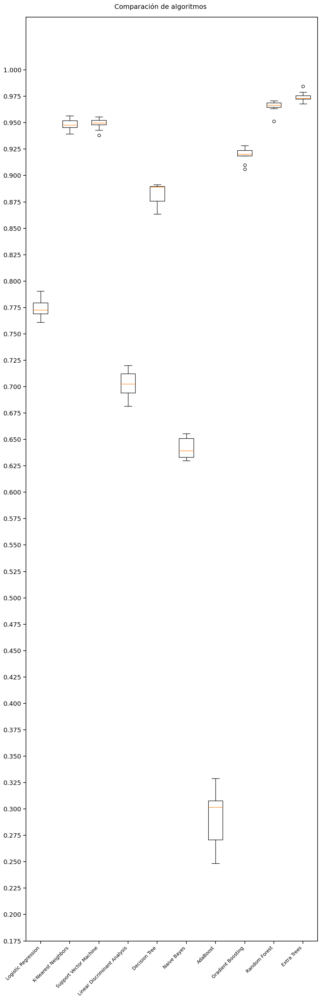

In [26]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Definir una función para formatear los ticks del eje y
def y_ticks_format(value, pos):
    return f'{value:.3f}'

# Crear la figura y ajustar su tamaño
fig = plt.figure(figsize=(10, 30))  # Aumentar la altura para dar más espacio al eje y
fig.suptitle('Comparación de algoritmos', fontsize=14)

# Añadir el subplot
ax = fig.add_subplot(111)

# Crear el boxplot
ax.boxplot(scores)

# Ajustar las etiquetas del eje x
ax.set_xticklabels(modelos, rotation=45, ha='right', fontsize=10)

# Ajustar el formato del eje y
ax.yaxis.set_major_formatter(FuncFormatter(y_ticks_format))

# Establecer los ticks del eje y con incrementos de 0.025, empezando desde 0.175
yticks = [i/1000 for i in range(175, 1001, 25)]
ax.set_yticks(yticks)

# Ajustar el rango del eje y para comenzar desde 0.175
ax.set_ylim(0.175, 1.05)  # Agregar un poco de margen superior

# Ajustar el espaciado de la figura para evitar solapamientos
plt.tight_layout(pad=2, rect=[0, 0, 1, 1])  # Ajustar el espaciado general

# Mostrar el gráfico
plt.show()


<a id="section16"></a>
## <font color="#8A0883"> 2.6. Optimizando los parametros del modelo</font>

In [28]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import GridSearchCV, KFold

# Definir los parámetros a optimizar para Extra Trees
param_grid = {
    'n_estimators': [100, 200, 300],  # Número de árboles
    'max_depth': [None, 10, 20, 30],  # Profundidad máxima de los árboles
    'min_samples_split': [2, 5, 10],  # Número mínimo de muestras para dividir un nodo
    'min_samples_leaf': [1, 2, 4],    # Número mínimo de muestras en una hoja
    'bootstrap': [True, False]        # Si se usa muestreo con reemplazo
}

# Definir el modelo Extra Trees
model = ExtraTreesClassifier()

# Configurar la validación cruzada y la búsqueda en cuadrícula
kfold = KFold(n_splits=10, random_state=42, shuffle=True)  # Asegúrate de definir el seed
grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=kfold)

# Ajustar el modelo
grid_result = grid.fit(X, Y)

# Imprimir el mejor resultado
print("El mejor: %f usando %s" % (grid_result.best_score_, grid_result.best_params_))

# Imprimir los resultados de la búsqueda en cuadrícula
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f"{param}: {mean*100.0:,.2f}% ({stdev*100.0:,.2f}%)")


El mejor: 0.975500 usando {'bootstrap': False, 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
{'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}: 97.14% (0.42%)
{'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}: 97.18% (0.43%)
{'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}: 97.25% (0.43%)
{'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}: 96.88% (0.50%)
{'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}: 96.98% (0.59%)
{'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300}: 97.04% (0.52%)
{'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}: 95.99% (0.58%)
{'boot

In [29]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

# Parámetros
test_size = 0.2
random_state = 42  # Puedes ajustar el valor del seed si es necesario

# División de datos en conjuntos de entrenamiento y prueba
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=test_size, random_state=random_state)

# Definición y entrenamiento del modelo Extra Trees
model = ExtraTreesClassifier(n_estimators=300, max_depth=30, bootstrap=False, random_state=random_state)
model.fit(X_train, Y_train)

# Evaluación en el conjunto de entrenamiento
training_score = model.score(X_train, Y_train)
predicted_train = model.predict(X_train)
train_matriz = confusion_matrix(Y_train, predicted_train)

print("="*60)
print("TRAINING\n")
print(f'Accuracy (Training): {training_score*100.0:,.2f}%')
print("Confusion Matrix (Training):\n", train_matriz)

# Reporte de clasificación en el conjunto de entrenamiento
train_report = classification_report(Y_train, predicted_train)
print("Classification Report (Training):\n", train_report)

# Evaluación en el conjunto de prueba
test_score = model.score(X_test, Y_test)
predicted_test = model.predict(X_test)
test_matriz = confusion_matrix(Y_test, predicted_test)

print("="*60)
print("TESTING\n")
print(f'Accuracy (Testing): {test_score*100.0:,.2f}%')
print("Confusion Matrix (Testing):\n", test_matriz)

# Reporte de clasificación en el conjunto de prueba
test_report = classification_report(Y_test, predicted_test)
print("Classification Report (Testing):\n", test_report)


TRAINING

Accuracy (Training): 100.00%
Confusion Matrix (Training):
 [[640   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0 613   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0 599   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0 649   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0 627   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0   0 635   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0 613   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0 590   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0 609   0   0   0   0   0  

<a id="section17"></a>
## <font color="#8A0883"> 2.8. Pipeline</font>

In [31]:
#Construiremos un pequeño pipeline

#Evaluar
kfold=KFold(n_splits=10, random_state=seed, shuffle=True)
results=cross_val_score(model,X,Y,cv=kfold)
print(f"Accuracy:{results.mean()*100.0:,.2f} % ({results.std()*100.0:,.2f})%")

Accuracy:97.46 % (0.32)%


<a id="section11"></a>
## <font color="#8A0883"> Selección de Características
# SelectKBest </font>

In [33]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

# Extracción de caractersticas
test=SelectKBest(score_func=chi2,k=2)
fit=test.fit(X,Y)

# Scores
print(list(df_letter_recognition.columns[0:4]))
print(fit.scores_)

# Caracteristicas seleccionadas
features=fit.transform(X)
print(features[0:5, : ])


['x-box', 'y-box', 'width', 'high']
[ 1580.69357631   129.15484645  2211.99095288   243.14809159
  3334.95642045  3618.95044066  8573.85988615 10633.74331888
 10616.81325166  4550.38983909 13050.9628582   5830.93711024
 20533.82532735  3066.2171147  15886.77857683  1756.35701021]
[[0 0]
 [2 4]
 [3 3]
 [6 2]
 [1 5]]


<a id="section11"></a>
## <font color="#8A0883"> Eliminación Recursiva de Características

</font>

In [37]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
import pandas as pd

# Asegúrate de que X sea un DataFrame de Pandas
X_RE = pd.DataFrame(X, columns=['x-box', 'y-box', 'width', 'high', 'onpix', 'x-bar', 'y-bar', 'x2bar', 'y2bar', 'xybar', 'x2ybr', 'xy2br', 'x-ege', 'xegvy', 'y-ege', 'yegvx'])

# Transformar y a un array unidimensional si es necesario
y_ravel = Y.ravel()

# Crear el modelo de Random Forest
model = RandomForestClassifier(n_estimators=300, max_depth=30, bootstrap=False, random_state=seed)

# Inicializar y ajustar RFE
rfe = RFE(model, n_features_to_select=2)
fit = rfe.fit(X_RE, y_ravel)

# Mostrar resultados
print("Columnas originales:")
print(list(X_RE.columns))
print(f'Número de características seleccionadas: {fit.n_features_}')
print(f'Características seleccionadas: {fit.support_}')
print(f'Ranking de características: {fit.ranking_}')

# Mostrar nombres de las características seleccionadas
selected_features = [col for col, selected in zip(X_RE.columns, fit.support_) if selected]
print(f'Características seleccionadas: {selected_features}')


Columnas originales:
['x-box', 'y-box', 'width', 'high', 'onpix', 'x-bar', 'y-bar', 'x2bar', 'y2bar', 'xybar', 'x2ybr', 'xy2br', 'x-ege', 'xegvy', 'y-ege', 'yegvx']
Número de características seleccionadas: 2
Características seleccionadas: [False False False False False False False False False False  True False
  True False False False]
Ranking de características: [14 11 13 15 12 10  8  2  4  5  1  6  1  7  3  9]
Características seleccionadas: ['x2ybr', 'x-ege']


<a id="section11"></a>
## <font color="#8A0883"> PCA </font>

In [38]:
import pandas as pd
from sklearn.decomposition import PCA

# Realizar PCA
pca = PCA(n_components=2)
fit = pca.fit(X)
X_transform = pca.transform(X)

# Mostrar resultados
print(f"Explained Variance: {fit.explained_variance_ratio_}")
print(f"Components: {pca.components_}")
df_pca = pd.DataFrame(data=X_transform, columns=['PC1', 'PC2','PC3'])
print("La suma es:", sum(fit.explained_variance_ratio_))
df_pca.head()


Explained Variance: [0.28676168 0.1506864 ]
Components: [[ 0.33417165  0.59859073  0.35093672  0.39335343  0.36330048  0.04767791
  -0.02768356 -0.00211644  0.02767386  0.0408074  -0.04688022 -0.00640851
   0.24636116 -0.00175839  0.22697695 -0.01477503]
 [ 0.08819399  0.07441425  0.07254262  0.02665321 -0.03530108 -0.26486987
   0.53503496 -0.17351968 -0.02100641  0.23308129  0.59911447 -0.12675917
  -0.01050595  0.27756345 -0.22642546 -0.18639551]]
La suma es: 0.4374480766306736


,PC1,PC2
0,-3.818090,5.574631
1,2.958174,-3.469226
2,4.885103,-2.836150
3,3.895993,0.097786
4,-7.819106,-4.754563


In [46]:
import pandas as pd
from sklearn.decomposition import PCA

# Realizar PCA
pca = PCA(n_components=12)
fit = pca.fit(X)
X_transform = pca.transform(X)

# Mostrar resultados
print(f"Explained Variance: {fit.explained_variance_ratio_}")
print(f"Components: {pca.components_}")
df_pca = pd.DataFrame(data=X_transform, columns=['PC1', 'PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11,','PC12'])
print("La suma es:", sum(fit.explained_variance_ratio_))
df_pca.head()


Explained Variance: [0.28676168 0.1506864  0.12506651 0.08751311 0.07601489 0.05613688
 0.05076389 0.03927907 0.03150354 0.02366307 0.01754998 0.01606569]
Components: [[ 0.33417165  0.59859073  0.35093672  0.39335343  0.36330048  0.04767791
  -0.02768356 -0.00211644  0.02767386  0.0408074  -0.04688022 -0.00640851
   0.24636116 -0.00175839  0.22697695 -0.01477503]
 [ 0.08819399  0.07441425  0.07254262  0.02665321 -0.03530108 -0.26486987
   0.53503496 -0.17351968 -0.02100641  0.23308129  0.59911447 -0.12675917
  -0.01050595  0.27756345 -0.22642546 -0.18639551]
 [ 0.01691306 -0.12616517  0.01008621  0.01412761  0.11172554 -0.0588621
   0.04306847  0.574798   -0.45373292 -0.44953248  0.23074883  0.03267082
   0.39086816  0.05721874 -0.1247291   0.0377534 ]
 [-0.01516078  0.02812428 -0.08886594  0.11518981 -0.0472098  -0.31536276
   0.08839979  0.34944252  0.52665968 -0.29380614  0.21110499  0.2556354
  -0.30434718  0.06347271  0.41568545  0.056113  ]
 [-0.0396376  -0.41680076  0.08548335 -

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,"PC11,",PC12
0,-3.818090,5.574631,-2.219385,0.094730,-0.758392,1.775602,-2.710756,-5.055833,2.502940,1.545636,1.125950,-3.465308
1,2.958174,-3.469226,-3.585113,-2.411585,-5.004366,-1.747797,3.280998,-2.627754,-0.962406,-0.172003,-1.847298,-0.313433
2,4.885103,-2.836150,-3.869483,-3.140875,-1.222153,-0.331921,-0.495553,-1.534306,1.277299,0.643377,1.620197,-0.353433
3,3.895993,0.097786,1.848129,0.812217,-0.981530,2.583799,-4.260702,-0.221192,-1.081179,3.528187,-1.442850,-1.541574
4,-7.819106,-4.754563,0.419007,1.937901,1.880702,0.106913,1.216378,0.164290,0.373187,1.286621,-0.614377,0.186074


## Discusión y sustentación de respuesta.

<h2>Elección del Modelo Extra Trees</h2>
<p>El modelo Extra Trees se eligió por su alta precisión del 97.44% y baja variabilidad en los resultados. Supera a otros clasificadores como Random Forest y Gradient Boosting en precisión y estabilidad, y su capacidad para manejar la complejidad de los datos lo hace más confiable en comparación con modelos como K-Nearest Neighbors y Support Vector Machine. Su eficacia, junto con su menor necesidad de ajuste de parámetros, lo convierte en la mejor opción.</p>

<h3>Conjunto Óptimo de Parámetros</h3>
<p>El mejor conjunto de parámetros para el modelo fue el siguiente: <code>{'bootstrap': False, 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}</code>, logrando una precisión de 97.55%. Esta configuración se destacó por varias razones:</p>
<ul>
    <li><strong>Uso de Bootstrap:</strong> Al desactivar el <code>bootstrap</code>, el modelo usa el conjunto completo de datos para entrenar cada árbol, lo que puede mejorar la precisión cuando se combinan múltiples árboles en el bosque.</li>
    <li><strong>Profundidad Máxima (<code>max_depth</code>):</strong> Un <code>max_depth</code> de 30 permite que los árboles crezcan lo suficiente para capturar patrones complejos sin sobreajustar, lo que balancea la capacidad de generalización del modelo.</li>
    <li><strong>Número de Estimadores (<code>n_estimators</code>):</strong> Con 300 estimadores, el modelo tiene un número suficientemente alto de árboles para mejorar la precisión, sin llegar al punto de rendimientos decrecientes.</li>
    <li><strong>Tamaño de las Muestras y Divisiones:</strong> Mantener <code>min_samples_leaf</code> en 1 y <code>min_samples_split</code> en 2 permite que los árboles se ajusten a los datos con gran flexibilidad, lo que contribuye a una mejor adaptación a las características del conjunto de datos.</li>
</ul>

<p>En comparación con otras configuraciones, esta combinación específica mostró la mejor capacidad de generalización y rendimiento, optimizando la precisión del modelo en la tarea.</p>

<h3>Componentes del PCA</h3>
<p>Se utilizaron 12 componentes en el PCA porque explican el 96.10% de la varianza total de los datos, lo que significa que retienen casi toda la información importante. Esto equilibra bien la reducción de dimensionalidad con la preservación de información, facilitando el análisis sin perder detalles cruciales. Elegir menos componentes podría resultar en pérdida de información, mientras que elegir más no ofrece beneficios significativos.</p>
